<a href="https://colab.research.google.com/github/lvb86/PD_LSTM_GA/blob/main/code/RS_2013_2018_dados.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Etapa de análise e limpeza de dados

Generalizando para todas as classes de consumo RS
por Leandro Barbosa

##Declarações

In [1]:
pip install -U scikit-learn

In [2]:
import math
import matplotlib.pyplot    as plt
import matplotlib.ticker    as ticker
import matplotlib.style     as style
import numpy                as np
import seaborn              as sns
import pandas               as pd

from urllib.request                 import urlopen
from zipfile                        import ZipFile
from statsmodels.graphics.tsaplots  import plot_acf, plot_pacf
from statsmodels.tsa.seasonal       import seasonal_decompose
from sklearn.metrics                import mean_squared_error
from sklearn.metrics                import mean_absolute_percentage_error
from sklearn.linear_model           import LinearRegression

stl = style.available
%matplotlib inline

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
swap        = '/tmp/'
url2019     = 'https://drive.google.com/uc?id=1Zr21cViYLsFcA8UVVN0BCK-1hFbSMqQP&export=download'
urlINMET    = 'https://github.com/lvb86/MLPr_GA/blob/4c119c5d100c0e9b808e3b3775c1c64713b7844d/data/INMET.zip?raw=true'

In [4]:
mes = ['Jan','Fev','Mar','Abr','Mai','Jun','Jul','Ago','Set','Out','Nov','Dez']
mesN = [1,2,3,4,5,6,7,8,9,10,11,12]

palettes = ['Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r',
            'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r',
            'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r',
            'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r',
            'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r',
            'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn',
            'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r',
            'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r',
            'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r',
            'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3',
            'Set3_r', 'Spectral', 'Spectral_r',
            #'Vega10', 'Vega10_r', 'Vega20',
            'Vega20_r', 'Vega20b', 'Vega20b_r', 'Vega20c', 'Vega20c_r', 
            'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r',
            'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r',
            'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r',
            'brg', 'brg_r', 'bwr', 'bwr_r', 'cool', 'cool_r', 'coolwarm', 
            'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r',
            'flag', 'flag_r', 'gist_earth', 'gist_earth_r', 'gist_gray',
            'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 
            'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern',
            'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2',
            'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv',
            'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 
            #'jet', ##'jet_r', 
            'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral',
            'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma',
            'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 
            'rocket_r', 'seismic', 'seismic_r', ##'spectral', 'spectral_r', 
            'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r',
            'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r',
            'terrain', 'terrain_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r',
            'winter', 'winter_r']

# Definições de estilo
if 1==1: #tema Claro para artigo retrato
    DefPalette = palettes[13] #13 Dark2
    DefPaletteHist = 'rocket'
    DefStyle = stl[15] #15 Seaborn-Darkgrid
    DefSize = (10,6) #(17,6)
    DefGrid = ('-')

else: # tema Escuro para apresentação paisagem
    DefPalette = palettes[123] #123 - hsv
    DefPaletteHist = 'rocket'
    DefStyle = stl[4] #15 dark_background
    DefSize = (10,6) #(17,6)
    DefGrid = (':')
    plt.rc_context({'axes.edgecolor':'gray', 'xtick.color':'white', 
                    'ytick.color':'white', 'figure.facecolor':'black'})


In [5]:
# Para traduzir ticker para PT-BR
def formatador_de_milhares(valor, p):
    valor = f"{valor:,.0f}"
    mapa_de_traducao = str.maketrans(',.', '.,')
    return valor.translate(mapa_de_traducao)
#exemplo de uso 
#ax.yaxis.set_major_formatter(ticker.FuncFormatter(formatador_de_milhares))
#Powered by @lpeixoto2000

## Análise de Consumo de Energia

### Importação dos dados

In [6]:
# Data Frame Original
anuario2013_2018 = pd.read_csv(url2019, encoding='UTF8', parse_dates=True, index_col='Data')
anuario2013_2018.head()

,TipoConsumidor,Sistema,UF,SetorN1,SetorN2,SetorN3,Tensão N1,Tensão N2,Tensão N3,Tensão N4,Faixa de Consumo N1,Faixa de Consumo N2,Consumidores,Consumo
Data,,,,,,,,,,,,,,
2013-01-01,Cativo,Sul,RS,Residencial,Convencional (Exceto Baixa Renda),Convencional (Exceto Baixa Renda),A - Alta Tensão,Alta Tensão Residencial,Alta Tensão Residencial,Alta Tensão Residencial,Alta Tensão,Alta Tensão,2.0,16.0
2013-02-01,Cativo,Sul,RS,Residencial,Convencional (Exceto Baixa Renda),Convencional (Exceto Baixa Renda),A - Alta Tensão,Alta Tensão Residencial,Alta Tensão Residencial,Alta Tensão Residencial,Alta Tensão,Alta Tensão,2.0,21.0
2013-03-01,Cativo,Sul,RS,Residencial,Convencional (Exceto Baixa Renda),Convencional (Exceto Baixa Renda),A - Alta Tensão,Alta Tensão Residencial,Alta Tensão Residencial,Alta Tensão Residencial,Alta Tensão,Alta Tensão,2.0,18.0
2013-04-01,Cativo,Sul,RS,Residencial,Convencional (Exceto Baixa Renda),Convencional (Exceto Baixa Renda),A - Alta Tensão,Alta Tensão Residencial,Alta Tensão Residencial,Alta Tensão Residencial,Alta Tensão,Alta Tensão,2.0,16.0
2013-05-01,Cativo,Sul,RS,Residencial,Convencional (Exceto Baixa Renda),Convencional (Exceto Baixa Renda),A - Alta Tensão,Alta Tensão Residencial,Alta Tensão Residencial,Alta Tensão Residencial,Alta Tensão,Alta Tensão,2.0,17.0


In [7]:
anuario2013_2018.index.year.unique()

Int64Index([2013, 2014, 2015, 2016, 2017, 2018], dtype='int64', name='Data')

In [8]:
anuario2013_2018.columns

Index(['TipoConsumidor', 'Sistema', 'UF', 'SetorN1', 'SetorN2', 'SetorN3',
       'Tensão N1', 'Tensão N2', 'Tensão N3', 'Tensão N4',
       'Faixa de Consumo N1', 'Faixa de Consumo N2', 'Consumidores',
       'Consumo'],
      dtype='object')

In [9]:
SetorN1 = anuario2013_2018['SetorN1'].unique()
SetorN1

array(['Residencial', 'Industrial', 'Comercial', 'Rural', 'Poder Público',
       'Iluminação Pública', 'Serviço Público', 'Consumo Próprio'],
      dtype=object)

In [10]:
anuario2013_2018 = anuario2013_2018.reset_index()
anuario2013_2018['Ano'] = anuario2013_2018['Data'].dt.year
anuario2013_2018['Mês'] = anuario2013_2018['Data'].dt.month
anuario2013_2018['Ano Mês'] = anuario2013_2018['Data'].astype(str)
anuario2013_2018['Ano Mês'] = anuario2013_2018['Ano Mês'].str.slice(0,7)
#dfrs.drop(columns=['Data'], inplace= True)
anuario2013_2018 = anuario2013_2018.groupby(['Ano','Mês','Data','Ano Mês','SetorN1','UF']).sum(['Consumo']).drop(columns='Consumidores')

anuario2013_2018.sample(5)

,,,,,,Consumo
Ano,Mês,Data,Ano Mês,SetorN1,UF,
2017,9,2017-09-01,2017-09,Iluminação Pública,AC,4351.000
2015,12,2015-12-01,2015-12,Consumo Próprio,BA,5707.000
2018,11,2018-11-01,2018-11,Poder Público,MA,39828.638
2016,5,2016-05-01,2016-05,Poder Público,PI,21618.000
2018,8,2018-08-01,2018-08,Serviço Público,RS,59478.459


In [11]:
# Separando o ano de 2018 para validação
anuario2018 = anuario2013_2018.query("Ano=='2018'")
anuario2018.sample(5)

Consumo
Ano  Mês Data       Ano Mês SetorN1            UF           
2018 7   2018-07-01 2018-07 Rural              PB  22588.160
     11  2018-11-01 2018-11 Comercial          AL  67081.038
     8   2018-08-01 2018-08 Poder Público      MG  70523.009
     3   2018-03-01 2018-03 Iluminação Pública MT  28387.519
     10  2018-10-01 2018-10 Consumo Próprio    SP  14863.246

### Análise RS

In [12]:
# Separando o estado RS o ano de 2018 para validação
anuario2018RS = anuario2018.query("UF == 'RS'")
anuario2018RS.sample(5)

Consumo
Ano  Mês Data       Ano Mês SetorN1         UF            
2018 8   2018-08-01 2018-08 Consumo Próprio RS   20222.021
     2   2018-02-01 2018-02 Poder Público   RS   60607.166
     3   2018-03-01 2018-03 Consumo Próprio RS   20470.209
     8   2018-08-01 2018-08 Industrial      RS  892343.212
     6   2018-06-01 2018-06 Serviço Público RS   57713.869

In [13]:
anuario2018RS['Consumo'].sum()/1000_000

30.417987882

Recorte do anuário 2018 para Validação. 

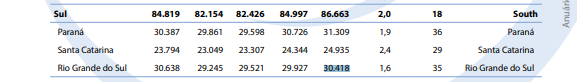

#### Consumo Por Setor N1

In [14]:
anuario2013_2018RS = anuario2013_2018.query("UF == 'RS'")

(array([0, 1, 2, 3, 4, 5, 6, 7]), <a list of 8 Text major ticklabel objects>)

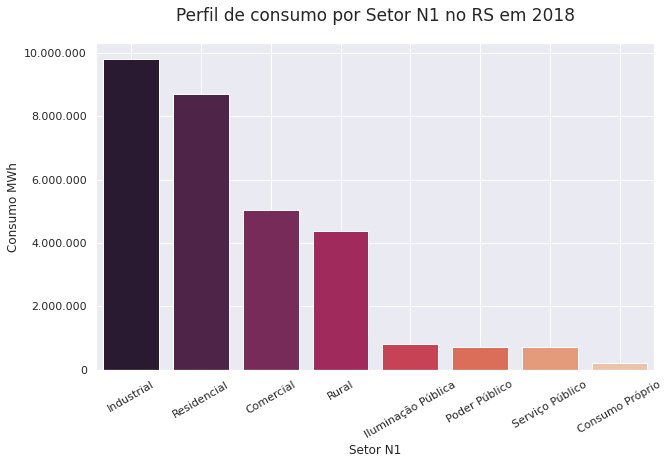

In [15]:
sns.set_theme()
style.use(DefStyle)  #4
plt.figure(figsize=(DefSize))
ax = sns.barplot(data = anuario2018RS.groupby(['SetorN1']).sum().sort_values('Consumo',
    ascending=False).reset_index(),x='SetorN1',y='Consumo', palette = DefPaletteHist)
#plt.ylim(0,150)
plt.grid(True,linestyle = DefGrid)
plt.title('Perfil de consumo por Setor N1 no RS em 2018', fontsize=17, y=1.05)
ax.yaxis.set_major_formatter(ticker.FuncFormatter(formatador_de_milhares))
plt.ylabel('Consumo MWh')
plt.xlabel('Setor N1')
plt.xticks(rotation = 30)
#ax.legend(loc='center right', bbox_to_anchor=(1.32, 0.5),ncol=1,fancybox=True, shadow=True)


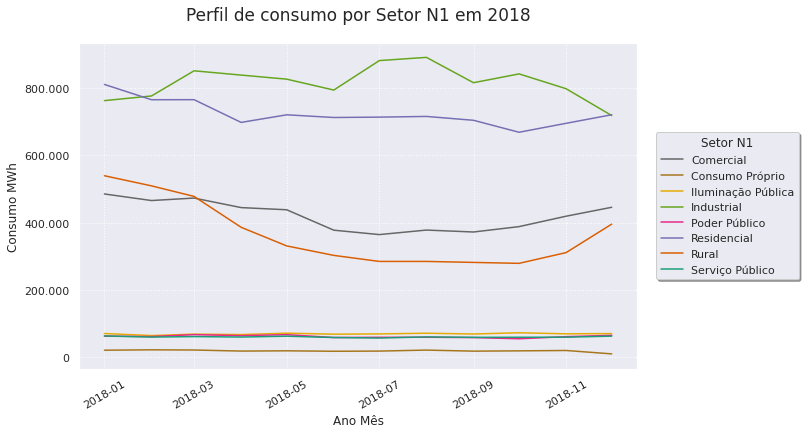

In [16]:
sns.set_theme()
style.use(DefStyle)  #4
plt.figure(figsize=DefSize)
ax = sns.lineplot( data=anuario2018RS.reset_index(), x='Data', y ='Consumo', hue='SetorN1', palette=DefPalette) 
plt.xticks(rotation = 30)
#plt.ylim(0,150)
plt.grid(True,linestyle = ':')
plt.title('Perfil de consumo por Setor N1 em 2018', fontsize=17, y= 1.05)
ax.yaxis.set_major_formatter(ticker.FuncFormatter(formatador_de_milhares))
plt.ylabel('Consumo MWh',)
plt.xlabel('Ano Mês')
ax.legend(loc='center right', bbox_to_anchor=(1.30, 0.5),ncol=1,fancybox=True, shadow=True, title='Setor N1')

plt.show()

#### Desvio Padrão por Setor N1

In [17]:
anuario2018RS_std = anuario2018RS.reset_index().groupby(
                    ['SetorN1']).std().sort_values(
                        by = 'Consumo',ascending=False).rename(
                            columns={"Consumo": "std"}).reset_index()

(array([0, 1, 2, 3, 4, 5, 6, 7]), <a list of 8 Text major ticklabel objects>)

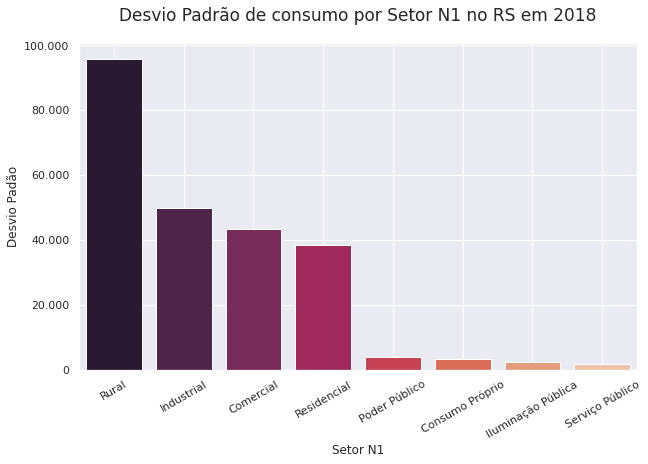

In [18]:
sns.set_theme()
style.use(DefStyle)  #4
plt.figure(figsize=(DefSize))
ax = sns.barplot(data = anuario2018RS_std,
            x='SetorN1', y='std', palette = DefPaletteHist
            )
#plt.ylim(0,150)
plt.grid(True,linestyle = DefGrid)
plt.title('Desvio Padrão de consumo por Setor N1 no RS em 2018',
          fontsize=17, y=1.05)
ax.yaxis.set_major_formatter(ticker.FuncFormatter(formatador_de_milhares))
plt.ylabel('Desvio Padão')
plt.xlabel('Setor N1')
plt.xticks(rotation = 30)

In [19]:
anuario2013_2018RS_std = anuario2013_2018RS.reset_index().groupby(
                    ['SetorN1']).std().sort_values(
                        by = 'Consumo',ascending=False).rename(
                            columns={"Consumo": "std"}).reset_index()

(array([0, 1, 2, 3, 4, 5, 6, 7]), <a list of 8 Text major ticklabel objects>)

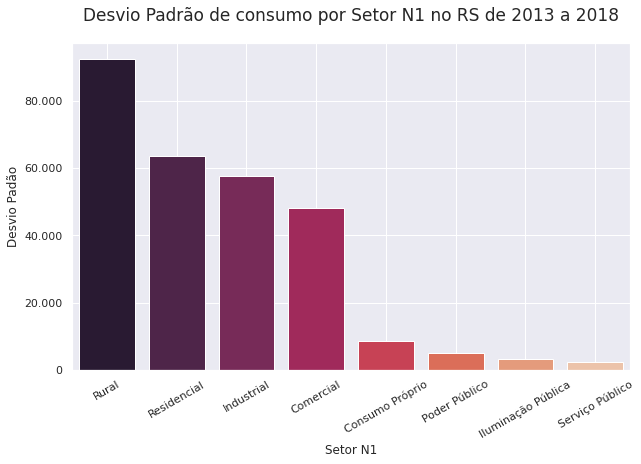

In [20]:
sns.set_theme()
style.use(DefStyle)  #4
plt.figure(figsize=(DefSize))
ax = sns.barplot(data = anuario2013_2018RS_std,
            x='SetorN1', y='std', palette = DefPaletteHist
            )
#plt.ylim(0,150)
plt.grid(True,linestyle = DefGrid)
plt.title('Desvio Padrão de consumo por Setor N1 no RS de 2013 a 2018',
          fontsize=17, y=1.05)
ax.yaxis.set_major_formatter(ticker.FuncFormatter(formatador_de_milhares))
plt.ylabel('Desvio Padão')
plt.xlabel('Setor N1')
plt.xticks(rotation = 30)

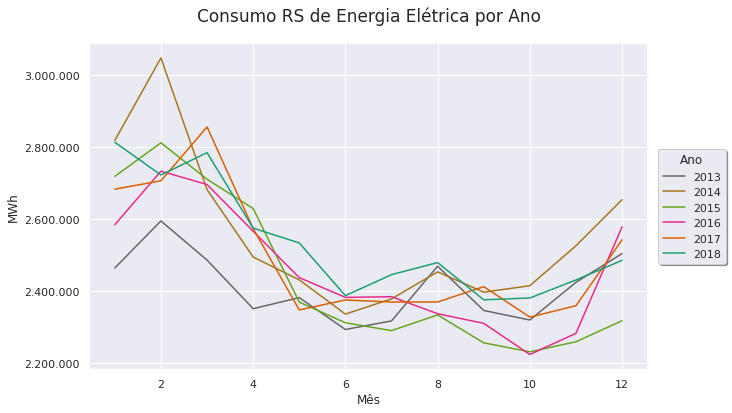

In [21]:
sns.set_theme()
style.use(DefStyle)
plt.figure(figsize=DefSize)
ax = sns.lineplot( data=anuario2013_2018RS.reset_index()[['Ano','Mês','Consumo']].groupby(['Ano','Mês']).sum(),
                  x='Mês', y ='Consumo', hue='Ano', palette=DefPalette)
ax.legend(loc='center right', bbox_to_anchor=(1.15, 0.5),ncol=1,fancybox=True,
          shadow=True, title = 'Ano')
plt.ylabel('MWh')
plt.title('Consumo RS de Energia Elétrica por Ano',y=1.05,fontsize = 17)
ax.yaxis.set_major_formatter(ticker.FuncFormatter(formatador_de_milhares))

plt.grid(True,linestyle = DefGrid)
#plt.xticks(rotation = 30)
#plt.ylim(0,75000)

plt.show()

#### Decomposição e Corelação

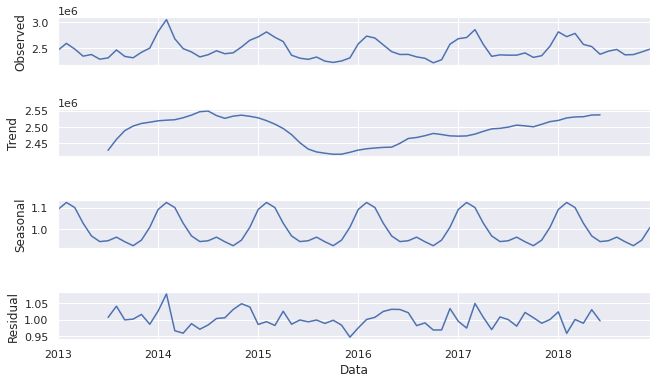

In [22]:
decomposicao = seasonal_decompose(
    anuario2013_2018RS.reset_index()[['Data','Consumo']].set_index('Data').groupby('Data').sum(),
     model='multiplicative')
sns.set_theme()
style.use(DefStyle)
ax = decomposicao.plot()   
plt.gcf().set_size_inches(DefSize)
    
plt.show();

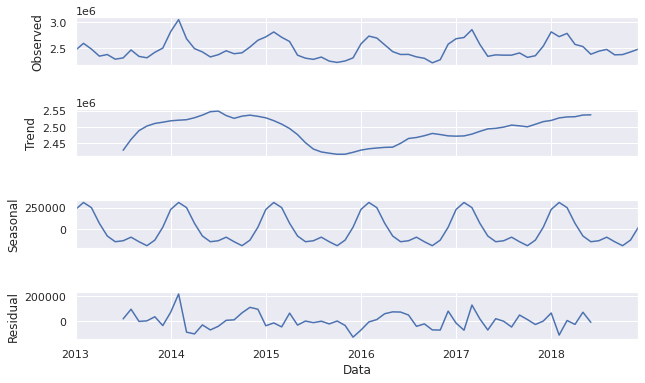

In [23]:
decomposicao = seasonal_decompose(
    anuario2013_2018RS.reset_index()[['Data','Consumo']].set_index('Data').groupby('Data').sum()
    ,model='additive')
decomposicao.plot()
plt.gcf().set_size_inches(DefSize)
plt.show();

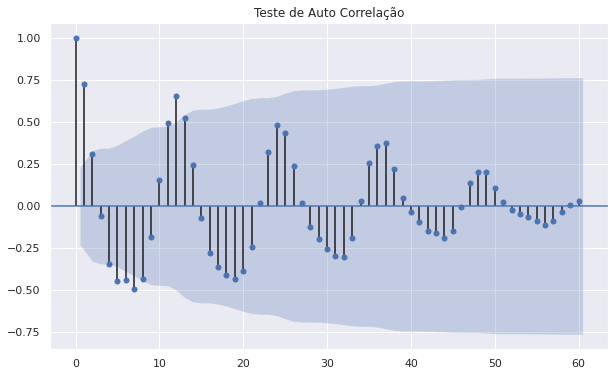

In [24]:
ax = plot_acf(anuario2013_2018RS.reset_index()[['Data','Consumo']].set_index('Data').groupby('Data').sum()['Consumo'],lags=60);
style.use(DefStyle) 
#plt.rc_context({'axes.edgecolor':'gray', 'xtick.color':'white', 'ytick.color':'white', 'figure.facecolor':'black'})

plt.title('Teste de Auto Correlação')
plt.gcf().set_size_inches(10, 6)
plt.grid(True,linestyle = DefGrid)
plt.show();

>Auto Correlação Positiva forte a cada 12M

>Auto Correlação Inversa Média a cada 6M

>Indicando uma possivel relação com o clima e as estações 


### Análise RS por SetorN1

In [25]:
def plt_perfil_ano(i):
    sns.set_theme()
    style.use(DefStyle)
    plt.figure(figsize=DefSize)
    data = anuario2013_2018RS.reset_index()[['Ano','Mês','SetorN1','Consumo']].groupby(['Ano','Mês','SetorN1']).sum()
    ax = sns.lineplot( data=data.reset_index().query(f"SetorN1 == '{i}'"),
                    x='Mês', y ='Consumo', hue='Ano', palette=DefPalette)
    ax.legend(loc='center right', bbox_to_anchor=(1.15, 0.5),ncol=1,fancybox=True,
            shadow=True, title = 'Ano')
    plt.ylabel('MWh')
    plt.title(f'Consumo RS de Energia Elétrica por Ano, Detalhe: SetorN1 = {i}'
            ,y=1.05,fontsize = 17)
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(formatador_de_milhares))

    plt.grid(True,linestyle = DefGrid)
    #plt.xticks(rotation = 30)
    #plt.ylim(0,75000)

    plt.show()

In [26]:
def plt_decomposicao(i):

    data = anuario2013_2018RS.reset_index()[['Data','SetorN1','Consumo']].groupby(['Data','SetorN1']).sum()
    data = data.query(f"SetorN1 == '{i}'").reset_index()
    data = data.set_index('Data').drop(columns=['SetorN1'])
    
    data.sample(5)

    decomposicao = seasonal_decompose(data,model='multiplicative')
    
    sns.set_theme()
    style.use(DefStyle)
    plt.figure(figsize=DefSize)
    ax = decomposicao.plot()   
    plt.gcf().set_size_inches(DefSize)
    axs = ax.get_axes()
    axs[0].set_title(f'Decomposição Temporal, Detalhe: SetorN1 = {i}')    
    plt.show();

In [27]:
def plt_acf(i): 
    style.use(DefStyle) 

    data = anuario2013_2018RS.reset_index()[['Data','SetorN1','Consumo']].groupby(['Data','SetorN1']).sum()
    data = data.query(f"SetorN1 == '{i}'").reset_index()
    data = data.set_index('Data').drop(columns=['SetorN1'])
    plt.figure(figsize=DefSize)
    ax = plot_acf(data ,lags=60);
    #plt.rc_context({'axes.edgecolor':'gray', 'xtick.color':'white', 'ytick.color':'white', 'figure.facecolor':'black'})

    plt.title(f'Teste de Auto Correlação, Detalhe: SetorN1 = {i}')
    plt.gcf().set_size_inches(10, 6)
    plt.grid(True,linestyle = DefGrid)
    plt.show();


In [28]:
anuario2013_2018RS.reset_index()[['Data','SetorN1','Consumo']].groupby(['Data','SetorN1']).sum()

Consumo
Data       SetorN1                       
2013-01-01 Comercial           470456.000
           Consumo Próprio      49063.000
           Iluminação Pública   60929.000
           Industrial          730711.000
           Poder Público        54805.000
...                                   ...
2018-12-01 Industrial          718997.415
           Poder Público        64098.562
           Residencial         721388.958
           Rural               395485.763
           Serviço Público      61748.919

[576 rows x 1 columns]

########## 0 Residencial           ####################


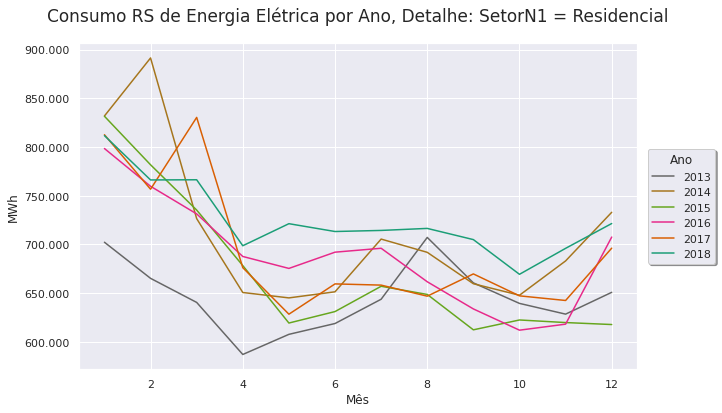

<Figure size 720x432 with 0 Axes>

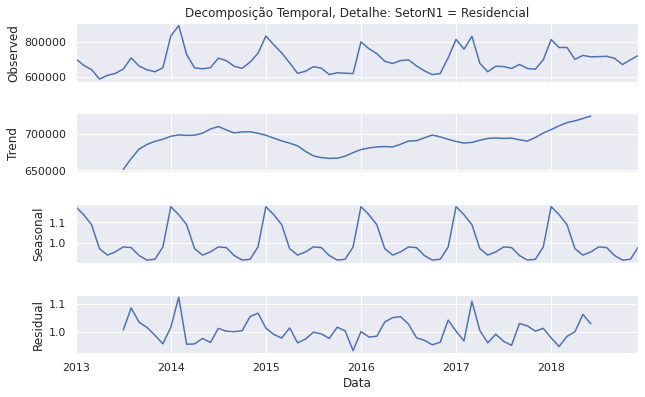

<Figure size 720x432 with 0 Axes>

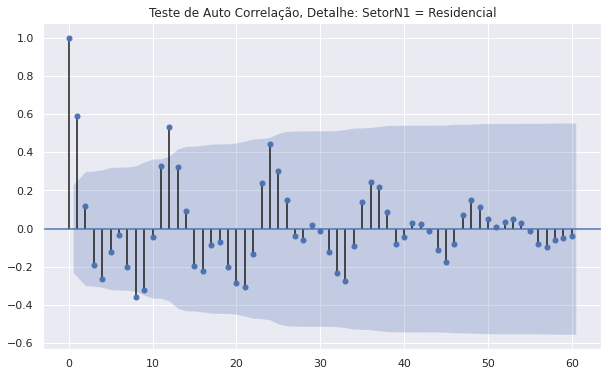

########## 1 Industrial            ####################


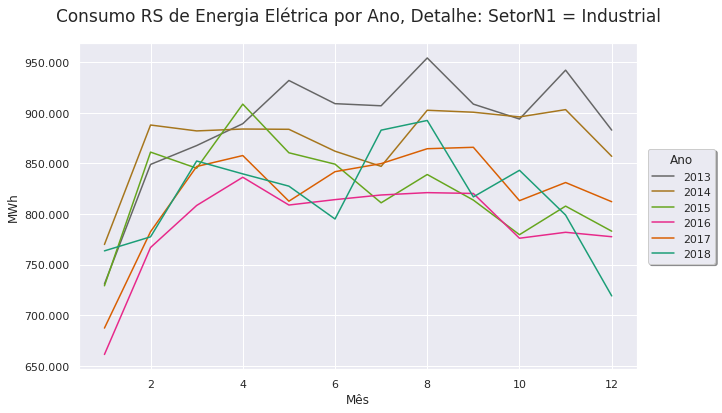

<Figure size 720x432 with 0 Axes>

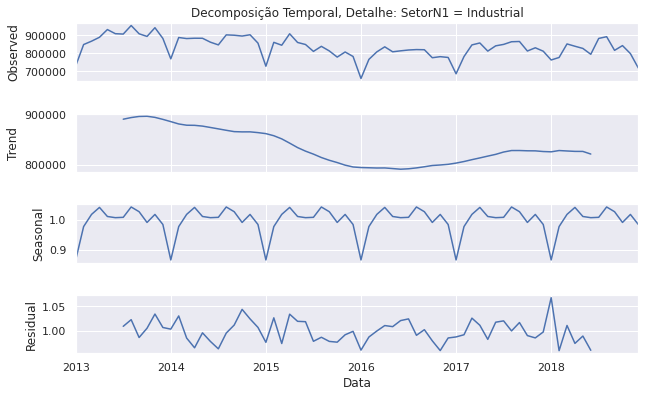

<Figure size 720x432 with 0 Axes>

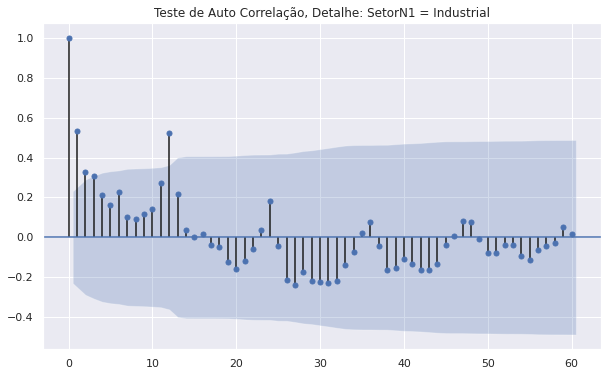

########## 2 Comercial             ####################


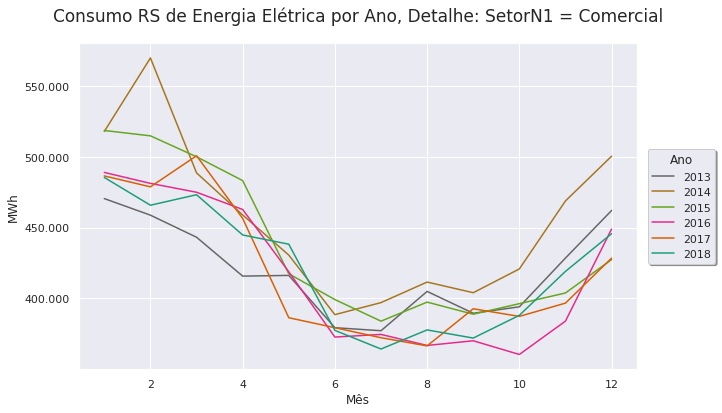

<Figure size 720x432 with 0 Axes>

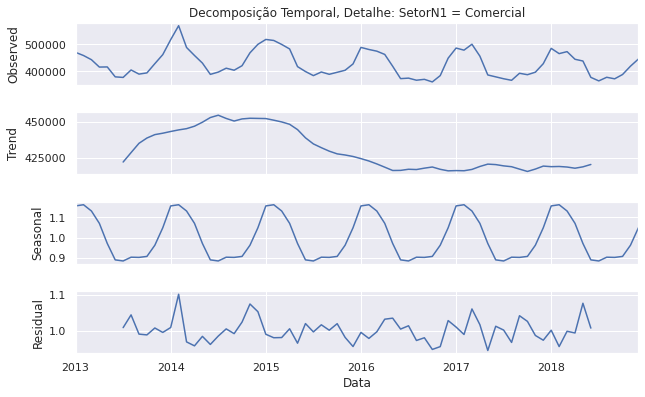

<Figure size 720x432 with 0 Axes>

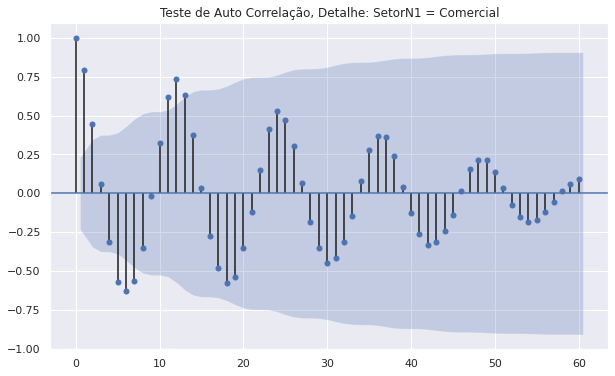

########## 3 Rural                 ####################


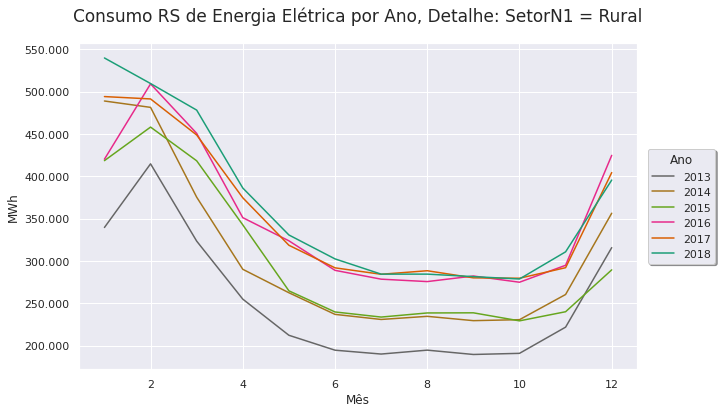

<Figure size 720x432 with 0 Axes>

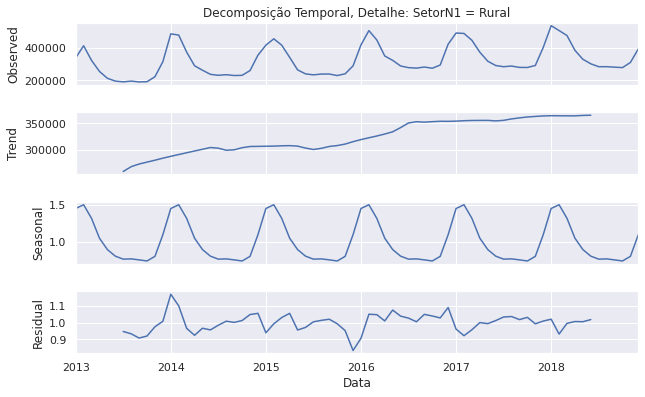

<Figure size 720x432 with 0 Axes>

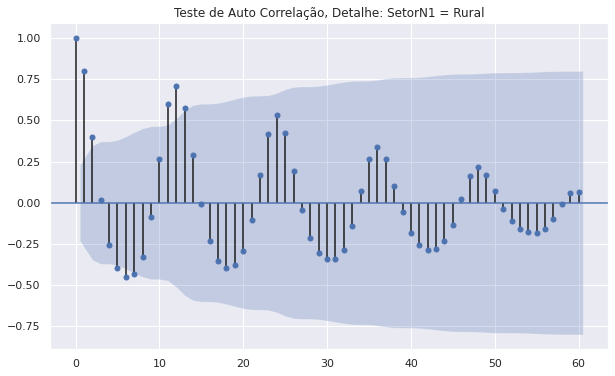

########## 4 Poder Público         ####################


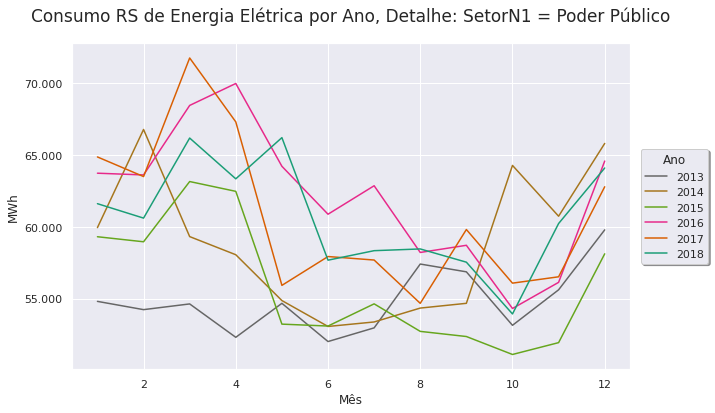

<Figure size 720x432 with 0 Axes>

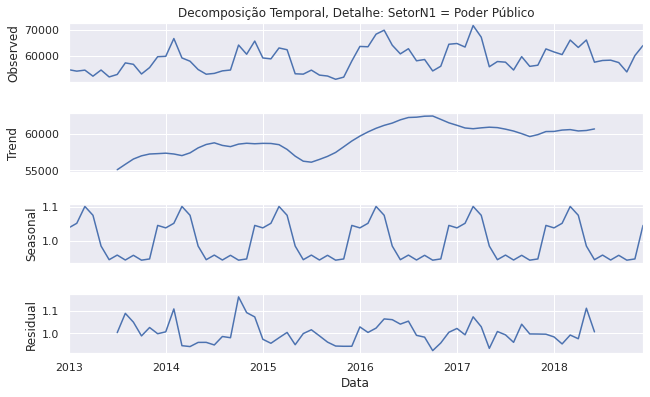

<Figure size 720x432 with 0 Axes>

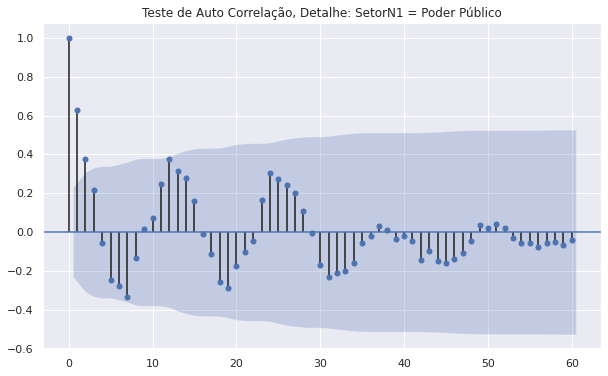

########## 5 Iluminação Pública    ####################


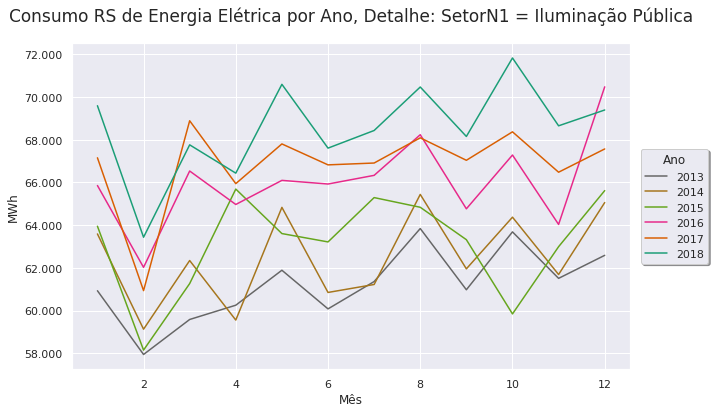

<Figure size 720x432 with 0 Axes>

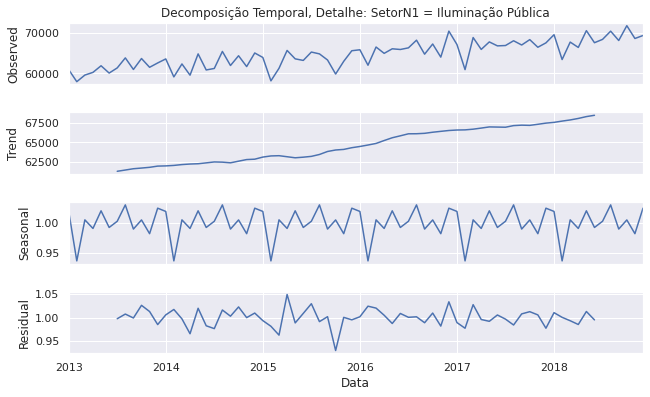

<Figure size 720x432 with 0 Axes>

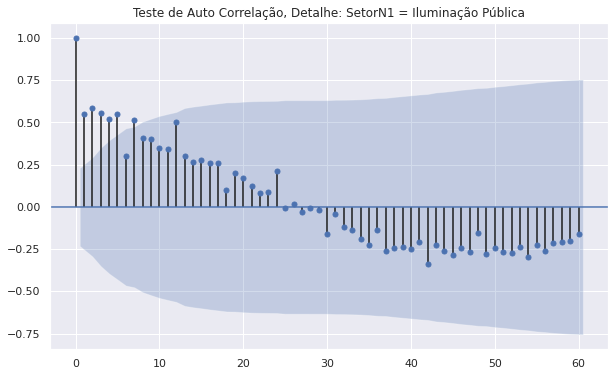

########## 6 Serviço Público       ####################


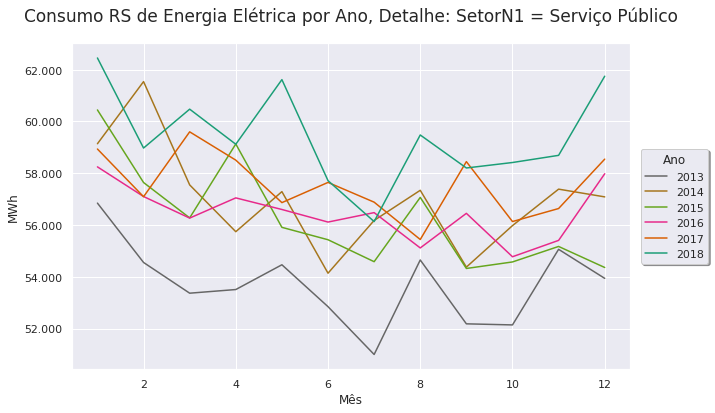

<Figure size 720x432 with 0 Axes>

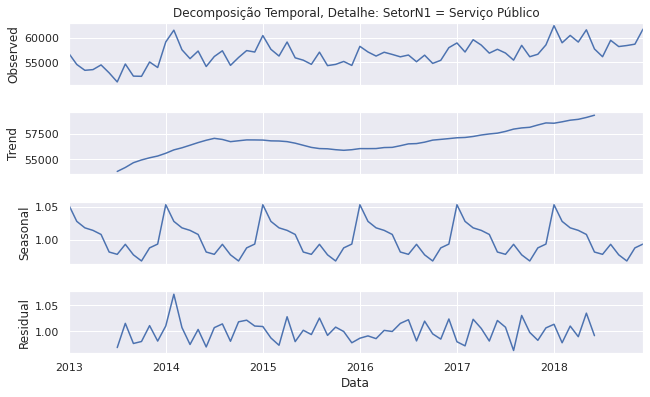

<Figure size 720x432 with 0 Axes>

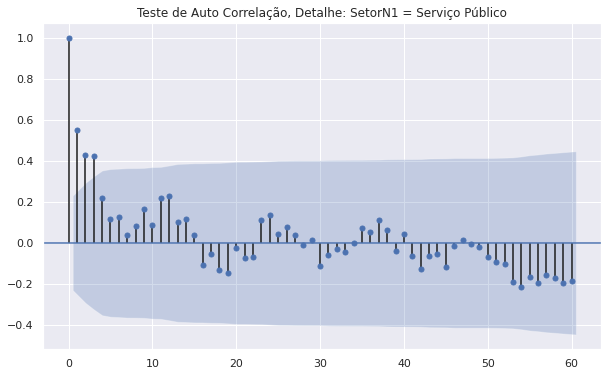

########## 7 Consumo Próprio       ####################


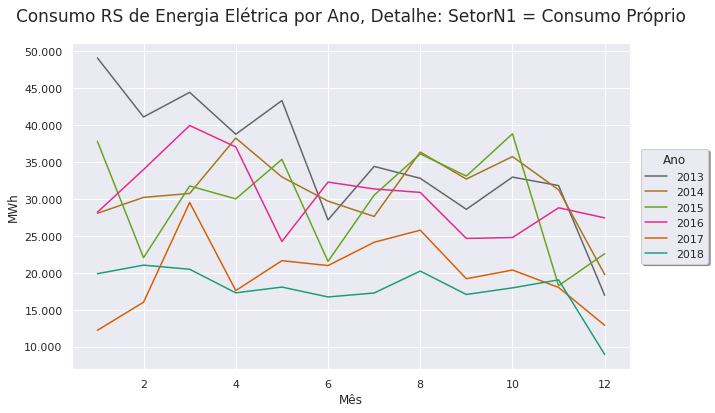

<Figure size 720x432 with 0 Axes>

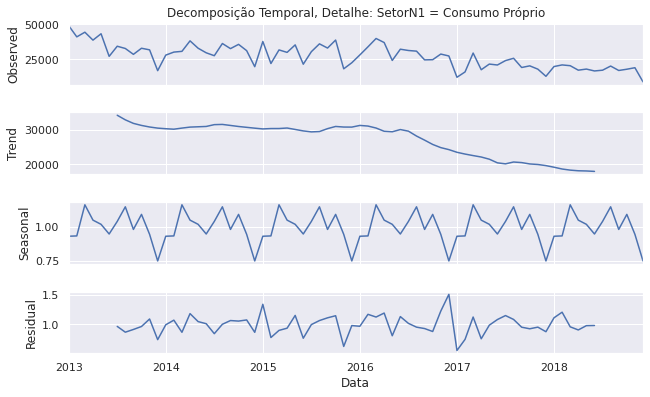

<Figure size 720x432 with 0 Axes>

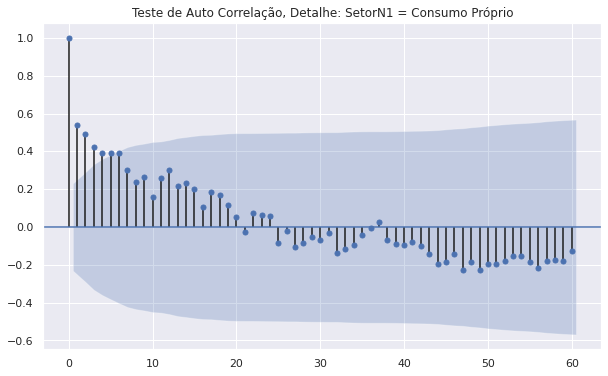

In [29]:
for e,i in enumerate(SetorN1):
    print('#'*10,e,i,' '*(20-len(i)),'#'*20)
    plt_perfil_ano(i)
    plt_decomposicao(i)
    plt_acf(i)

## Dados INMET

In [30]:
zipresp = urlopen(urlINMET)                # Download from URL
tempzip = open("/tmp/tempfile.zip", "wb")  # Create a new file
tempzip.write(zipresp.read())              # Write the contents of the downloaded file into the new file
tempzip.close()                            # Close the newly-created file
zip = ZipFile("/tmp/tempfile.zip")         # Re-open the newly-created file with ZipFile()

#Adaptado de 
#https://svaderia.github.io/articles/downloading-and-unzipping-a-zipfile/

In [31]:
#zip.infolist()
zip.namelist()

['dados_A801_M_2013-01-01_2018-12-31.csv',
 'dados_A802_M_2013-01-01_2018-12-31.csv',
 'dados_A803_M_2013-01-01_2018-12-31.csv',
 'dados_A804_M_2013-01-01_2018-12-31.csv',
 'dados_A805_M_2013-01-01_2018-12-31.csv',
 'dados_A808_M_2013-01-01_2018-12-31.csv',
 'dados_A809_M_2013-01-01_2018-12-31.csv',
 'dados_A810_M_2013-01-01_2018-12-31.csv',
 'dados_A811_M_2013-01-01_2018-12-31.csv',
 'dados_A812_M_2013-01-01_2018-12-31.csv',
 'dados_A813_M_2013-01-01_2018-12-31.csv',
 'dados_A826_M_2013-01-01_2018-12-31.csv',
 'dados_A827_M_2013-01-01_2018-12-31.csv',
 'dados_A828_M_2013-01-01_2018-12-31.csv',
 'dados_A829_M_2013-01-01_2018-12-31.csv',
 'dados_A830_M_2013-01-01_2018-12-31.csv',
 'dados_A831_M_2013-01-01_2018-12-31.csv',
 'dados_A832_M_2013-01-01_2018-12-31.csv',
 'dados_A833_M_2013-01-01_2018-12-31.csv',
 'dados_A834_M_2013-01-01_2018-12-31.csv',
 'dados_A836_M_2013-01-01_2018-12-31.csv',
 'dados_A837_M_2013-01-01_2018-12-31.csv',
 'dados_A838_M_2013-01-01_2018-12-31.csv',
 'dados_A83

In [32]:
listINMET = []
listINMET.append('dados_A801_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A802_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A803_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A804_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A805_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A808_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A809_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A810_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A811_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A812_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A813_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A826_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A827_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A828_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A829_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A830_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A831_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A832_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A833_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A834_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A836_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A837_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A838_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A839_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A840_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A844_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A852_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A853_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A854_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A856_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A878_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A879_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A881_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A882_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A883_M_2013-01-01_2018-12-31.csv')
listINMET.append('dados_A884_M_2013-11-28_2018-12-31.csv')
#listINMET.append('dados_A886_M_2016-08-10_2018-12-31.csv')
#listINMET.append('dados_A889_M_2016-04-05_2018-12-31.csv')
#listINMET.append('dados_A893_M_2018-03-14_2018-12-31.csv')
#listINMET.append('dados_A894_M_2016-03-31_2018-12-31.csv')
#listINMET.append('dados_A897_M_2016-11-23_2018-12-31.csv')
listINMET.append('dados_A899_M_2013-01-01_2018-12-31.csv')

In [33]:
for e,i in enumerate(listINMET):
    if e ==0: 
        clima = pd.read_csv(zip.open(i),encoding='UTF-8', skiprows=9, sep=';',parse_dates=True, decimal=',')
        clima['origem'] = i[6:10]
    else:
        clima2 = pd.read_csv(zip.open(i),encoding='UTF-8', skiprows=9, sep=';',parse_dates=True, decimal=',')
        clima2['origem'] = i[6:10]
        clima = clima.append(clima2)
clima.sample(5)
clima.shape

(2654, 9)

In [34]:
#Carregando todos cabeçalhos dos arquivos INMET
for e, i in enumerate(listINMET):
    if e ==0:
        climaH = pd.read_csv(zip.open(i), encoding='UTF-8', nrows=8, sep=': ',
                             parse_dates=True, decimal=',').T
        header = climaH.iloc[0]
        climaH.columns = header
        climaH = climaH[1:]
    else:
        climaH2 = pd.read_csv(zip.open(i), encoding='UTF-8', nrows=8, sep=': ',
                              parse_dates=True, decimal=',').T
        climaH2.columns = header
        climaH2 = climaH2[1:]
        climaH = climaH.append(climaH2)
climaH.shape

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  # This is added back by InteractiveShellApp.init_path()


(37, 8)

In [35]:
climaH = climaH.reset_index().set_index('Codigo Estacao').rename(columns={'index':'Cidade','Codigo Estacao':'origem'})

In [36]:
clima = clima.fillna(method='ffill')

In [37]:
colunasNomes = {
    'Data Medicao':'data',
    'NUMERO DE DIAS COM PRECIP. PLUV, MENSAL (AUT)(número)':'Dias_com_precip',
    'PRECIPITACAO TOTAL, MENSAL (AUT)(mm)':'precipitacao',
    'PRESSAO ATMOSFERICA, MEDIA MENSAL (AUT)(mB)':'pressao',
    'TEMPERATURA MEDIA, MENSAL (AUT)(°C)':'temperatura',
    'VENTO, VELOCIDADE MAXIMA MENSAL (AUT)(m/s)':'vento_max',
    'VENTO, VELOCIDADE MEDIA MENSAL (AUT)(m/s)':'vento_med', 
    'Unnamed: 7':'un',
    'origem':'origem'
}
clima.rename(columns=colunasNomes, inplace = True)
clima.drop(columns=['un'], inplace = True)
clima.columns

Index(['data', 'Dias_com_precip', 'precipitacao', 'pressao', 'temperatura',
       'vento_max', 'vento_med', 'origem'],
      dtype='object')

In [38]:
climaH.head()


Nome,Cidade,Latitude,Longitude,Altitude,Situacao,Data Inicial,Data Final,Periodicidade da Medicao
Codigo Estacao,,,,,,,,
A801,PORTO ALEGRE,-30.05361111,-51.17472221,41.18,Operante,2013-01-01,2018-12-31,Mensal
A802,RIO GRANDE,-32.07878,-52.167738,4.92,Operante,2013-01-01,2018-12-31,Mensal
A803,SANTA MARIA,-29.72499999,-53.72055554,103.1,Operante,2013-01-01,2018-12-31,Mensal
A804,SANTANA DO LIVRAMENTO,-30.75055555,-55.40138888,196,Operante,2013-01-01,2018-12-31,Mensal
A805,SANTO AUGUSTO,-27.854345,-53.791179,489.67,Operante,2013-01-01,2018-12-31,Mensal


In [39]:
climaEX = pd.merge(clima,climaH, left_on='origem', right_on='Codigo Estacao', how='right')

In [40]:
parametros = clima.columns[1:-1]

In [41]:
Mediatemperatura = climaEX[['data','temperatura']].groupby('data').mean()
Mediatemperatura.rename(columns={'temperatura':('temperatura','media')}, inplace = True)

MediaDias_com_precip = climaEX[['data','Dias_com_precip']].groupby('data').mean()
MediaDias_com_precip.rename(columns={'Dias_com_precip':('Dias_com_precip','media')}, inplace = True)

Mediaprecipitacao = climaEX[['data','precipitacao']].groupby('data').mean()
Mediaprecipitacao.rename(columns={'precipitacao':('precipitacao','media')}, inplace = True)

Mediapressao = climaEX[['data','pressao']].groupby('data').mean()
Mediapressao.rename(columns={'pressao':('pressao','media')}, inplace = True)

Mediavento_max = climaEX[['data','vento_max']].groupby('data').mean()
Mediavento_max.rename(columns={'vento_max':('vento_max','media')}, inplace = True)

Mediavento_med = climaEX[['data','vento_med']].groupby('data').mean()
Mediavento_med.rename(columns={'vento_med':('vento_med','media')}, inplace = True)

In [42]:
climaPivot = climaEX[['data','temperatura','Cidade']].pivot('data','Cidade')
climaPivot = pd.merge(climaPivot, Mediatemperatura, right_on='data', left_on='data')

climaPivot2 = climaEX[['data','Dias_com_precip','Cidade']].pivot('data','Cidade')
climaPivot2 = pd.merge(climaPivot2, MediaDias_com_precip, right_on='data', left_on='data')
climaPivot = pd.merge(climaPivot, climaPivot2, right_on='data', left_on='data')

climaPivot2 = climaEX[['data','precipitacao','Cidade']].pivot('data','Cidade')
climaPivot2 = pd.merge(climaPivot2, Mediaprecipitacao, right_on='data', left_on='data')
climaPivot = pd.merge(climaPivot, climaPivot2, right_on='data', left_on='data')

climaPivot2 = climaEX[['data','pressao','Cidade']].pivot('data','Cidade')
climaPivot2 = pd.merge(climaPivot2, Mediapressao, right_on='data', left_on='data')
climaPivot = pd.merge(climaPivot, climaPivot2, right_on='data', left_on='data')

climaPivot2 = climaEX[['data','vento_max','Cidade']].pivot('data','Cidade')
climaPivot2 = pd.merge(climaPivot2, Mediavento_max, right_on='data', left_on='data')
climaPivot = pd.merge(climaPivot, climaPivot2, right_on='data', left_on='data')

climaPivot2 = climaEX[['data','vento_med','Cidade']].pivot('data','Cidade')
climaPivot2 = pd.merge(climaPivot2, Mediavento_med, right_on='data', left_on='data')
climaPivot = pd.merge(climaPivot, climaPivot2, right_on='data', left_on='data')

climaPivot.head()


/usr/local/lib/python3.7/dist-packages/pandas/core/reshape/merge.py:643: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)


temperatura             ...  vento_med          
Cidade        ALEGRETE       BAGE  ... URUGUAIANA     media
data                               ...                     
2013-01-31   23.786694  21.754167  ...   3.165054  3.053842
2013-02-28   23.691815  22.096131  ...   3.203720  2.835475
2013-03-31   20.572126  19.188075  ...   3.060278  2.849183
2013-04-30   19.190833  18.074722  ...   2.568056  2.475605
2013-05-31   15.472581  14.034812  ...   2.653495  2.375910

[5 rows x 228 columns]

In [43]:
def analise_correlacao(par):
    '''
    Fitra prarâmetro no data frame para gerar mapa de correlação e ranking
    par: entrada de parâmento  
    return mapa de correlação e ranking 
    '''

    display(par)
    df = climaPivot[par]
    #display(df.head())
    #display(df.corr())
    
    plt.figure(figsize=(30,30))
    ax = sns.heatmap(df.corr(),cmap="YlGnBu", annot=True) 
    plt.title('Correlação Cruzada de '+ par,fontsize=20,y=1.10)
    plt.show();

    ranking = climaPivot[par].corr().sum()
    ranking.sort_values(ascending=False, inplace=True)
    rangingCorrMed = ranking/len(ranking)
    #sns.barplot(rangingCorrMed.reset_index())
    plt.figure(figsize=DefSize)
    ax = rangingCorrMed[:10].plot(kind='bar')
    plt.title('Ranking top 10 maiores correlações médias de '+ par,fontsize=17,y=1.05)
    plt.ylim(rangingCorrMed[10],rangingCorrMed.max())
    plt.show();


'Dias_com_precip'

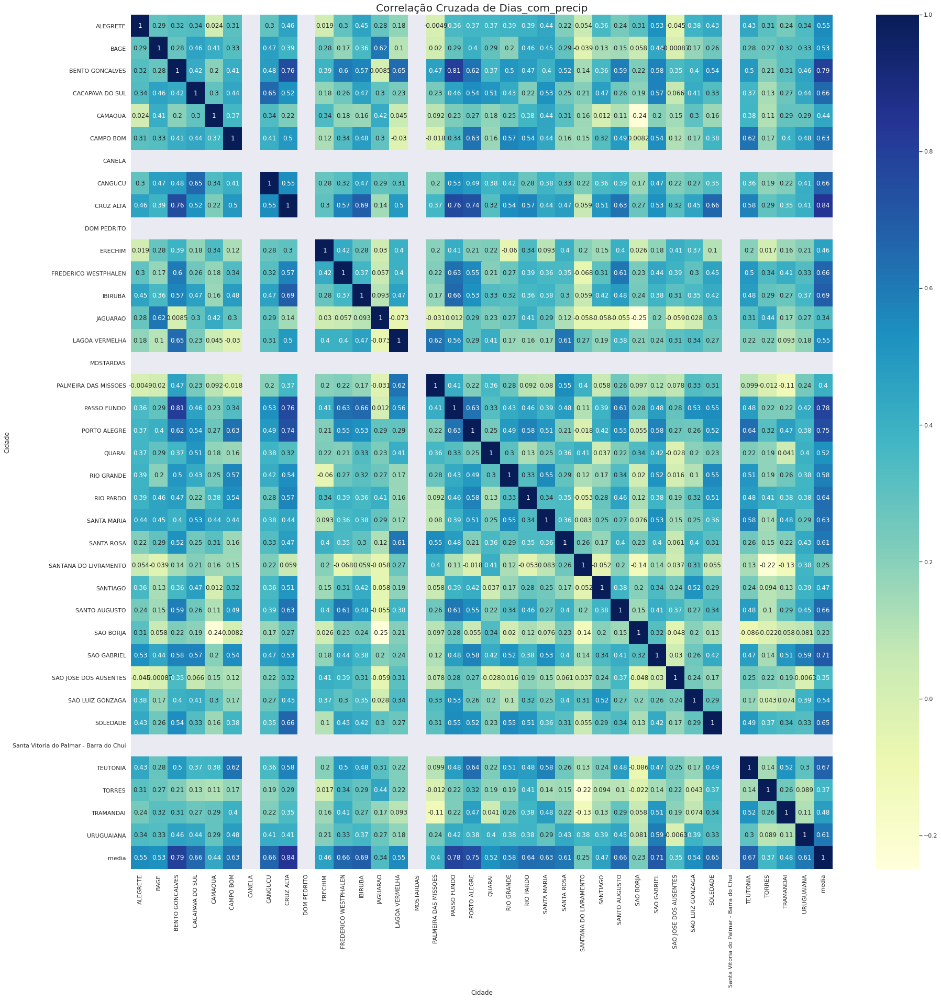

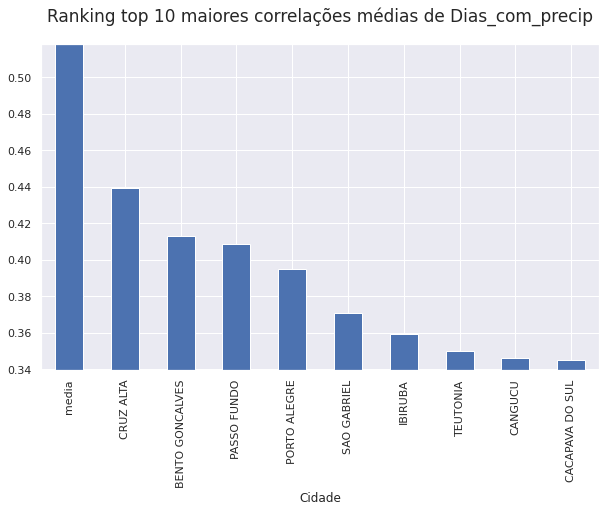

'precipitacao'

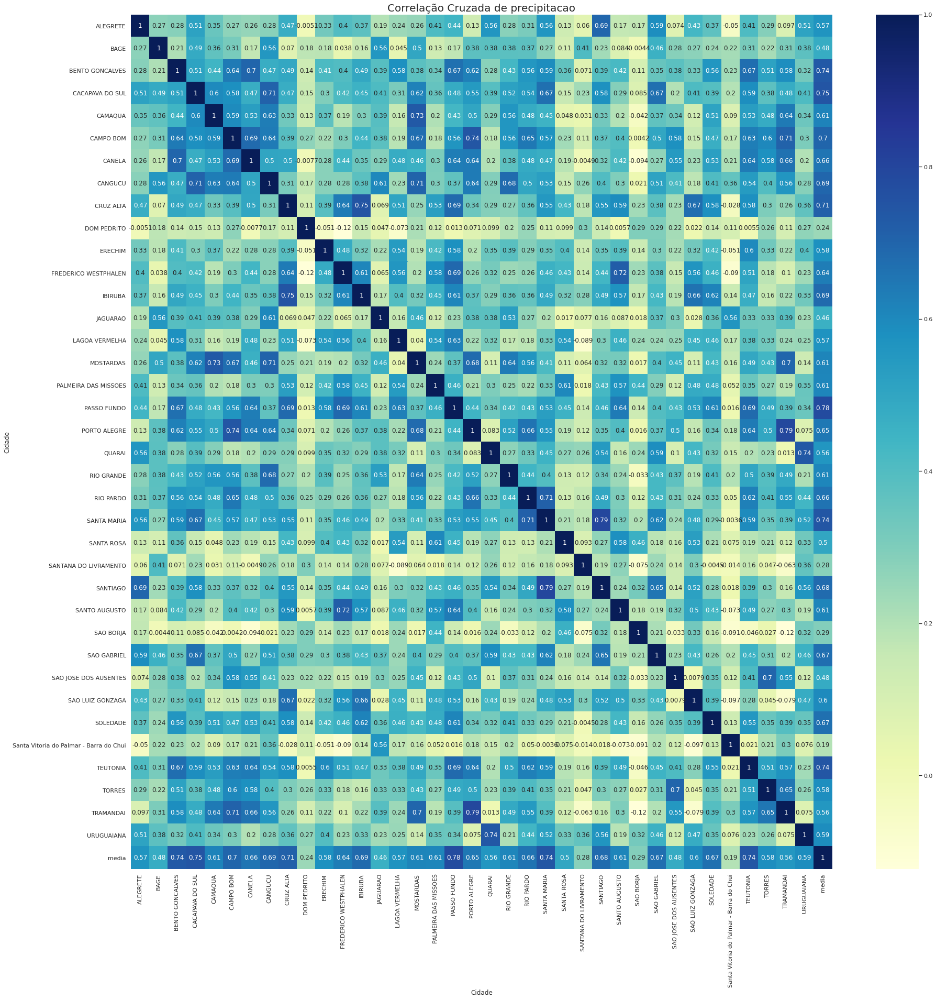

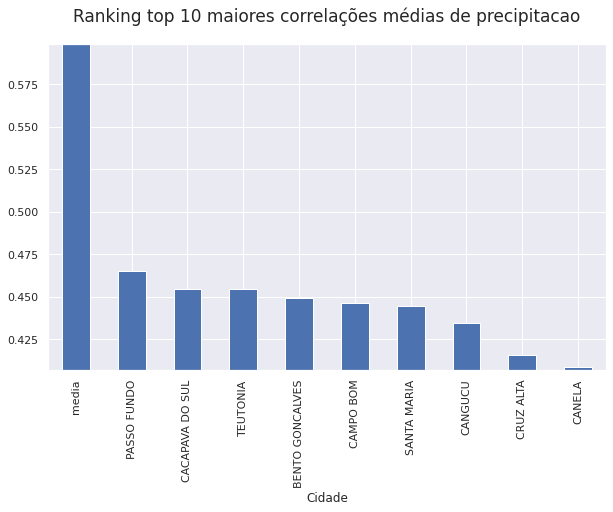

'pressao'

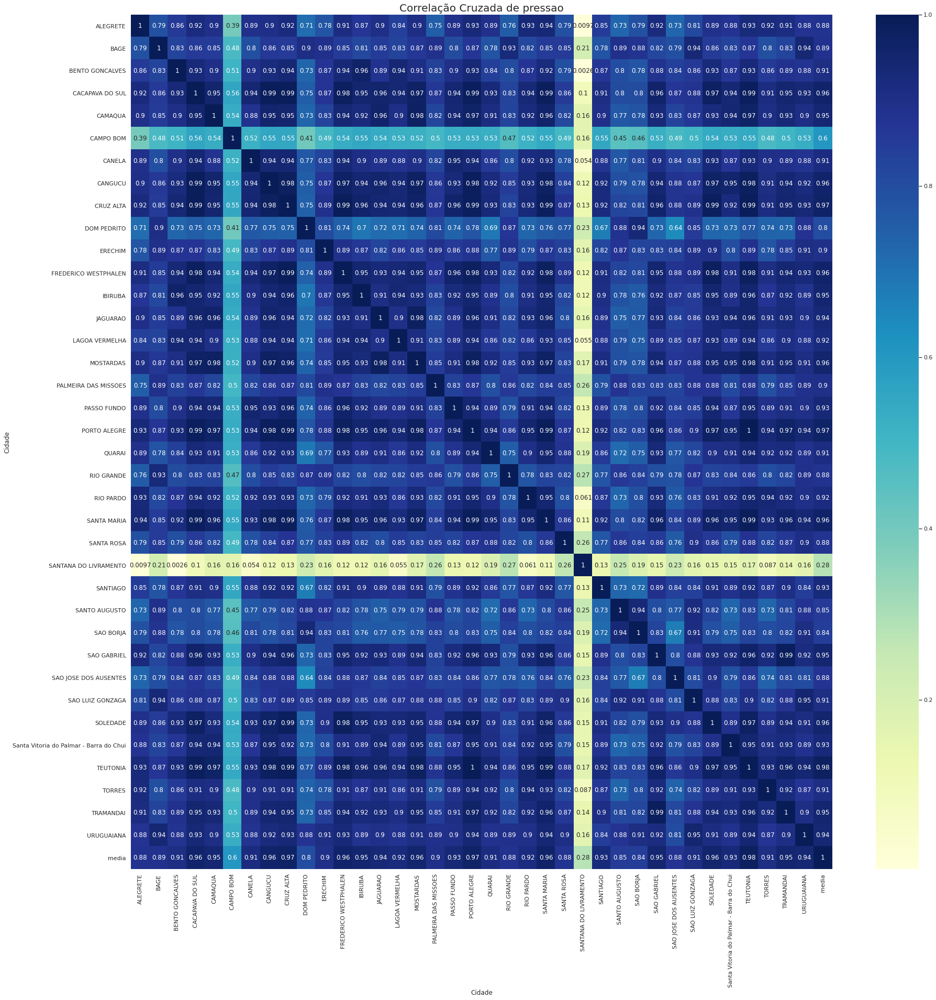

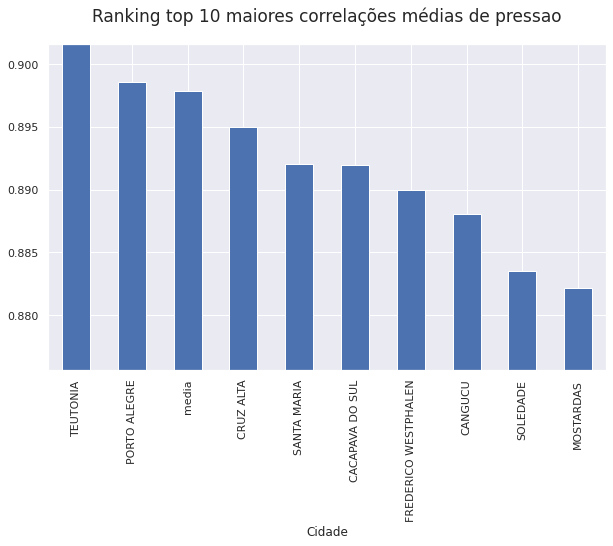

'temperatura'

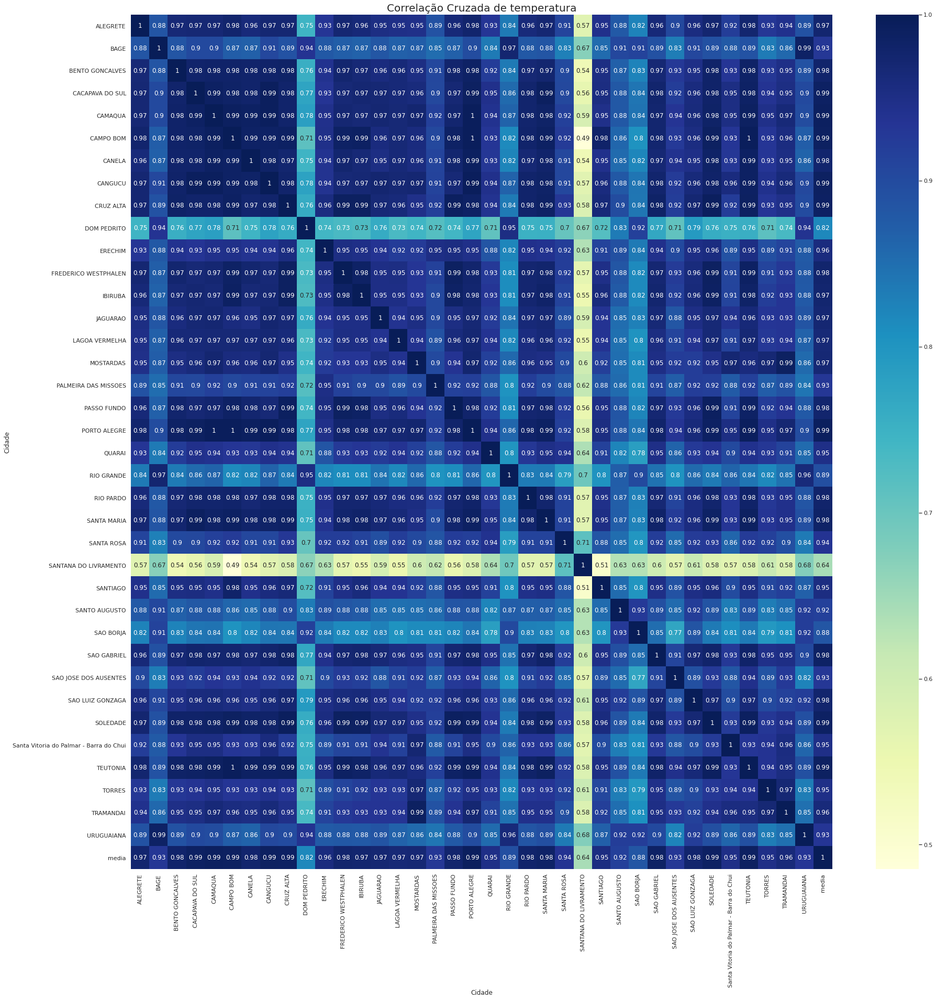

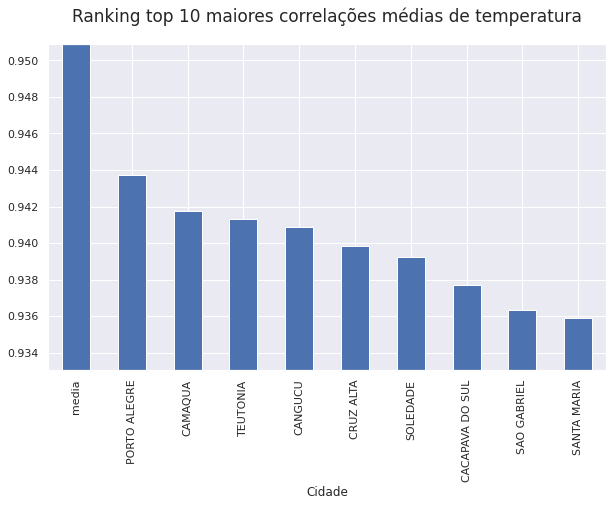

'vento_max'

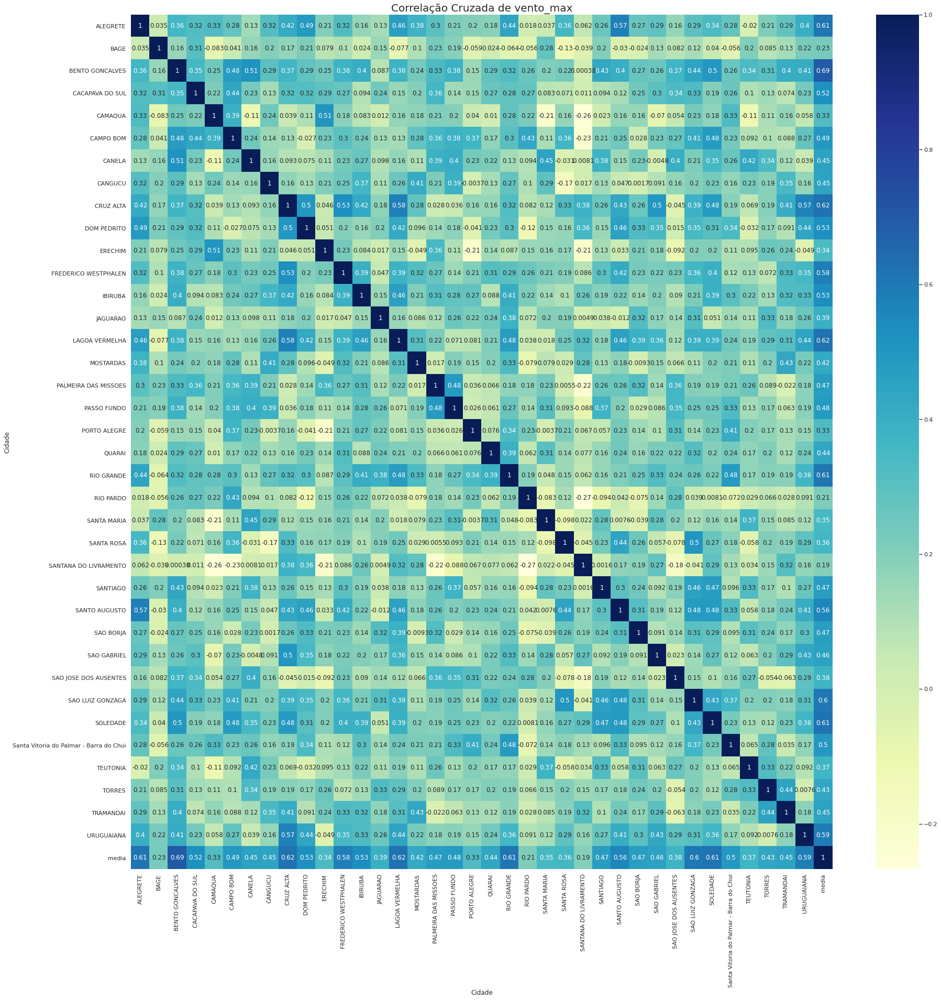

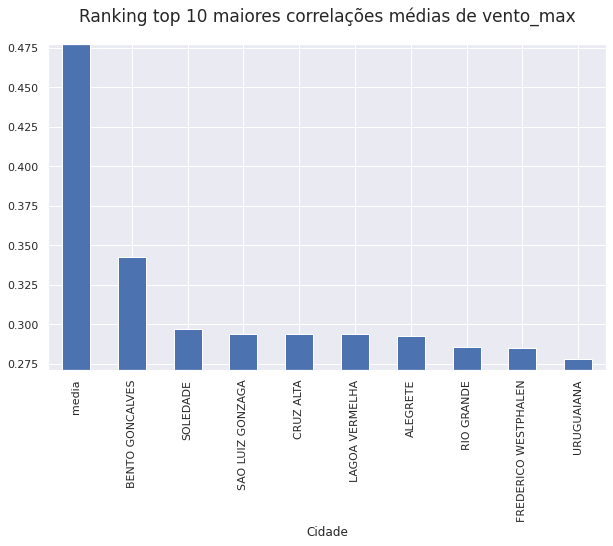

'vento_med'

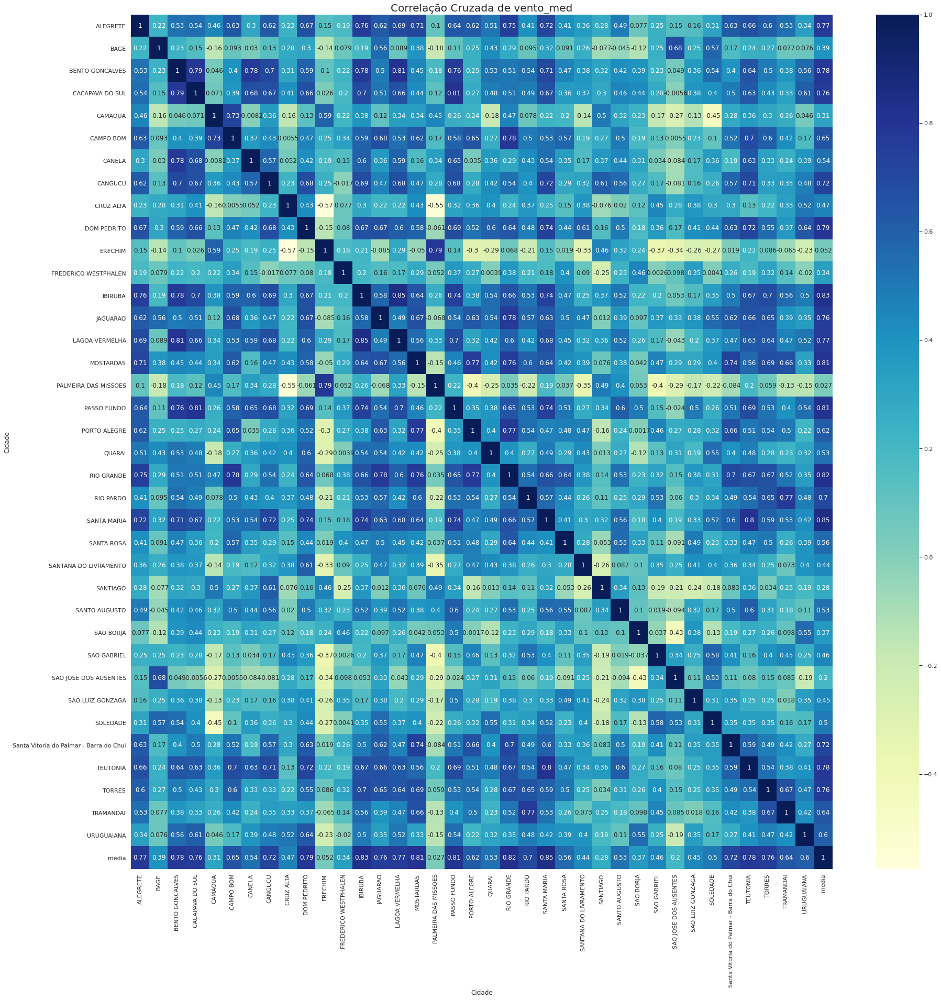

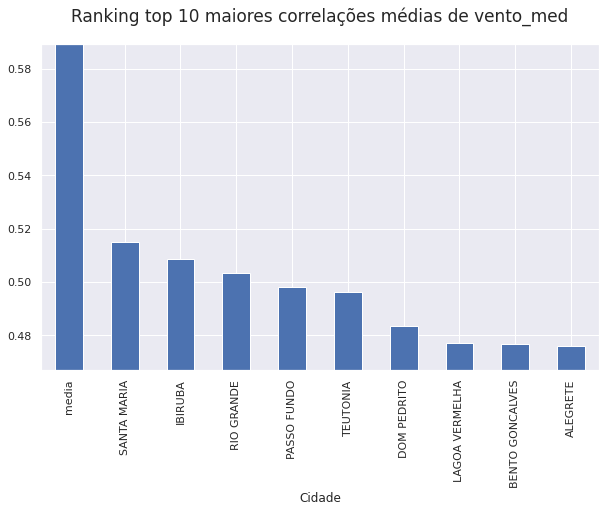

In [44]:
for i in parametros:
    analise_correlacao(i)

In [45]:
d = {('dt','data'): climaPivot.reset_index()['data'],
     ('dt','Ano'): climaPivot.reset_index()['data'].str[0:4],
     ('dt','Mês'): climaPivot.reset_index()['data'].str[5:7],
     ('dt','Ano Mês'): climaPivot.reset_index()['data'].str[0:7]}
datas = pd.DataFrame(d)

In [46]:
climaPivot = pd.merge(climaPivot,datas['dt'],right_on='data',left_on=('data'))
climaPivot.rename(columns={'Ano':('dt','Ano'),'Mês':('dt','Mês'),'Ano Mês':('dt','Ano Mês')}, inplace = True)

/usr/local/lib/python3.7/dist-packages/pandas/core/reshape/merge.py:643: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)


In [47]:
climaPivot.head()

,data,"(temperatura, ALEGRETE)","(temperatura, BAGE)","(temperatura, BENTO GONCALVES)","(temperatura, CACAPAVA DO SUL)","(temperatura, CAMAQUA)","(temperatura, CAMPO BOM)","(temperatura, CANELA)","(temperatura, CANGUCU)","(temperatura, CRUZ ALTA)","(temperatura, DOM PEDRITO)","(temperatura, ERECHIM)","(temperatura, FREDERICO WESTPHALEN)","(temperatura, IBIRUBA)","(temperatura, JAGUARAO)","(temperatura, LAGOA VERMELHA)","(temperatura, MOSTARDAS)","(temperatura, PALMEIRA DAS MISSOES)","(temperatura, PASSO FUNDO)","(temperatura, PORTO ALEGRE)","(temperatura, QUARAI)","(temperatura, RIO GRANDE)","(temperatura, RIO PARDO)","(temperatura, SANTA MARIA)","(temperatura, SANTA ROSA)","(temperatura, SANTANA DO LIVRAMENTO)","(temperatura, SANTIAGO)","(temperatura, SANTO AUGUSTO)","(temperatura, SAO BORJA)","(temperatura, SAO GABRIEL)","(temperatura, SAO JOSE DOS AUSENTES)","(temperatura, SAO LUIZ GONZAGA)","(temperatura, SOLEDADE)","(temperatura, Santa Vitoria do Palmar - Barra do Chui)","(temperatura, TEUTONIA)","(temperatura, TORRES)","(temperatura, TRAMANDAI)","(temperatura, URUGUAIANA)","(temperatura, media)","(Dias_com_precip, ALEGRETE)",...,"(vento_med, BAGE)","(vento_med, BENTO GONCALVES)","(vento_med, CACAPAVA DO SUL)","(vento_med, CAMAQUA)","(vento_med, CAMPO BOM)","(vento_med, CANELA)","(vento_med, CANGUCU)","(vento_med, CRUZ ALTA)","(vento_med, DOM PEDRITO)","(vento_med, ERECHIM)","(vento_med, FREDERICO WESTPHALEN)","(vento_med, IBIRUBA)","(vento_med, JAGUARAO)","(vento_med, LAGOA VERMELHA)","(vento_med, MOSTARDAS)","(vento_med, PALMEIRA DAS MISSOES)","(vento_med, PASSO FUNDO)","(vento_med, PORTO ALEGRE)","(vento_med, QUARAI)","(vento_med, RIO GRANDE)","(vento_med, RIO PARDO)","(vento_med, SANTA MARIA)","(vento_med, SANTA ROSA)","(vento_med, SANTANA DO LIVRAMENTO)","(vento_med, SANTIAGO)","(vento_med, SANTO AUGUSTO)","(vento_med, SAO BORJA)","(vento_med, SAO GABRIEL)","(vento_med, SAO JOSE DOS AUSENTES)","(vento_med, SAO LUIZ GONZAGA)","(vento_med, SOLEDADE)","(vento_med, Santa Vitoria do Palmar - Barra do Chui)","(vento_med, TEUTONIA)","(vento_med, TORRES)","(vento_med, TRAMANDAI)","(vento_med, URUGUAIANA)","(vento_med, media)","(dt, Ano)","(dt, Mês)","(dt, Ano Mês)"
0,2013-01-31,23.786694,21.754167,20.862769,21.111828,22.039113,NaN,18.609543,20.261828,22.035081,22.709274,20.718145,23.110887,22.085127,22.118683,20.150269,23.503226,21.749316,21.083468,23.843011,23.535349,22.933602,22.981183,23.433602,23.844624,21.799194,22.691667,22.796909,24.878933,24.189247,15.925806,24.358199,20.666129,22.659409,23.703898,23.425269,23.850789,24.422581,22.323023,6.0,...,3.124462,2.811290,3.825538,1.561425,NaN,2.670430,4.763441,3.510618,3.228898,2.127285,2.303360,2.598907,2.229704,3.432661,6.293800,2.597271,3.542204,1.752554,1.949462,3.780645,2.248387,2.066264,1.804839,2.593817,2.633602,2.529570,2.854885,2.180914,5.734409,2.453764,3.489247,5.102688,1.938190,3.426882,5.156335,3.165054,3.053842,2013,01,2013-01
1,2013-02-28,23.691815,22.096131,21.247173,21.706101,22.566369,NaN,19.239583,20.769222,21.960119,22.678869,20.848214,22.778869,22.235985,22.305952,20.496577,24.233184,21.960061,21.184524,24.398303,23.406101,23.444494,23.570536,23.539137,23.930208,21.864137,22.710714,22.947173,24.983929,24.309077,16.915774,24.398958,20.750298,22.757143,23.934524,23.780655,24.384375,24.481548,22.569606,9.0,...,3.169196,2.547470,3.809375,1.462500,NaN,2.619345,4.770704,2.716220,3.288691,1.974256,1.892708,2.304951,2.390327,2.896577,5.816964,2.581341,3.088542,1.674691,1.846131,3.740476,2.116667,1.930357,1.625298,2.694494,2.480804,2.262202,2.557589,1.997917,5.179464,2.288542,2.143006,5.927232,1.800935,2.742708,4.345089,3.203720,2.835475,2013,02,2013-02
2,2013-03-31,20.572126,19.188075,18.377011,18.696264,19.795115,NaN,16.769109,18.026580,19.200000,19.597414,18.312787,20.145115,19.325893,19.317385,17.653017,21.881753,19.225144,18.428448,21.266667,20.272126,20.681466,20.600431,20.562644,20.684770,18.937644,19.846824,20.012500,21.534483,21.235057,14.750144,21.081994

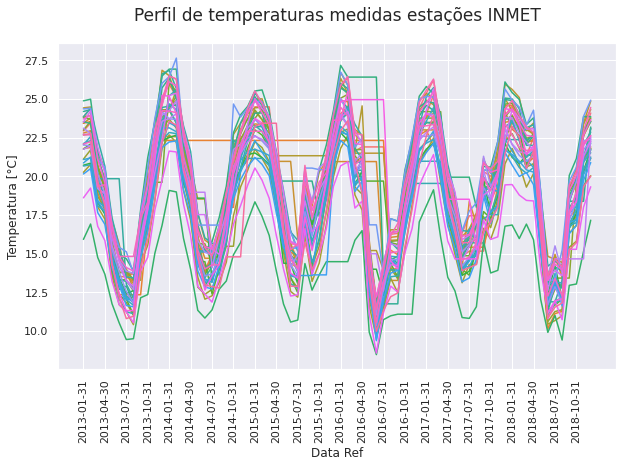

In [48]:
plt.figure(figsize=DefSize)
ax = sns.lineplot(data = climaEX,x = 'data', y= 'temperatura', hue='Cidade')
plt.title('Perfil de temperaturas medidas estações INMET', fontsize = 17, y=1.05)
plt.ylabel('Temperatura [°C]')
plt.xlabel('Data Ref')
plt.xticks(rotation = 90)
plt.legend().remove()
ax.set_xticks(ax.get_xticks()[::3])
plt.show();

In [49]:
parametrosT = ['Dias com Precipitação', 'Precipitacão', 'Pressão', 'Temperatura',
       'Vento Maxímo', 'Vento Médio']

parametrosU = ['', '[mm]', '[mB]', '[°C]',
       '[m/s]', '[m/s]']

len(parametros)

6

In [50]:
def perfil_medio_clima(_i, _Prefixo = 'Perfil Médio de ', _Escopo = ' no RS'):
    '''
    Gera gráficos de perfis de históricos climáticos apartir de Dataframe e
     Parâmetros de entrada
    '''
    dfTemp = climaPivot[[('dt', 'Ano'),('dt', 'Mês'),('dt', 'Ano Mês'),(parametros[_i],'media')]].reset_index()
    dfTemp.columns = ['col1','Ano','Mês','Ano Mês',parametros[_i]]
    dfTemp.drop('col1', axis =1, inplace = True)
    sns.set_theme()
    style.use(DefStyle)
    plt.figure(figsize=DefSize)
    plt.title(_Prefixo + parametrosT[_i] + _Escopo,y=1.05,fontsize = 17)
    ax = sns.lineplot(data=dfTemp,palette=DefPalette, x = 'Mês', y = parametros[_i], hue = 'Ano') #'hsv'
    plt.grid(True,linestyle = ':')
    #plt.xticks(rotation = 30)

    ax.legend(loc='center right', bbox_to_anchor=(1.15, 0.5), ncol=1, fancybox=False, shadow=True, title = 'Ano')
    plt.ylabel(parametrosT[_i] + ' ' + parametrosU[_i])
    plt.xlabel('Mês')
    plt.show()

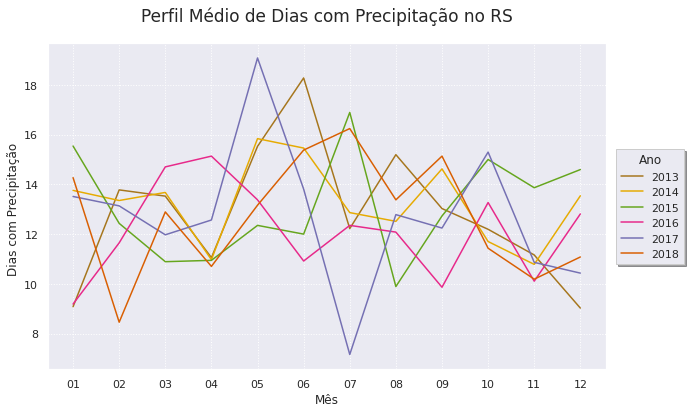

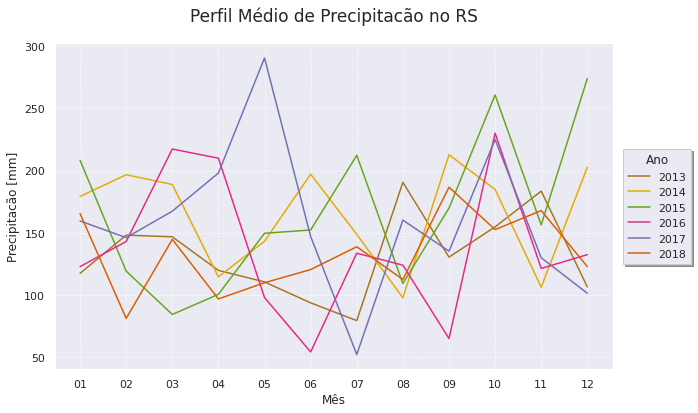

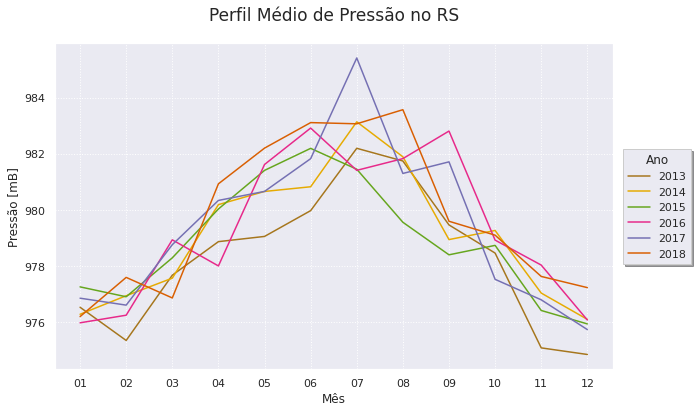

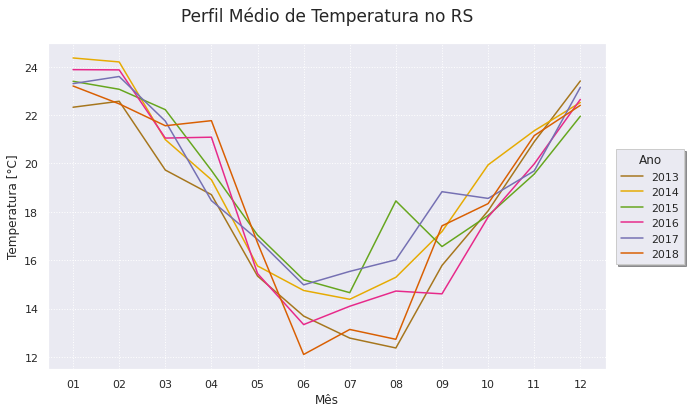

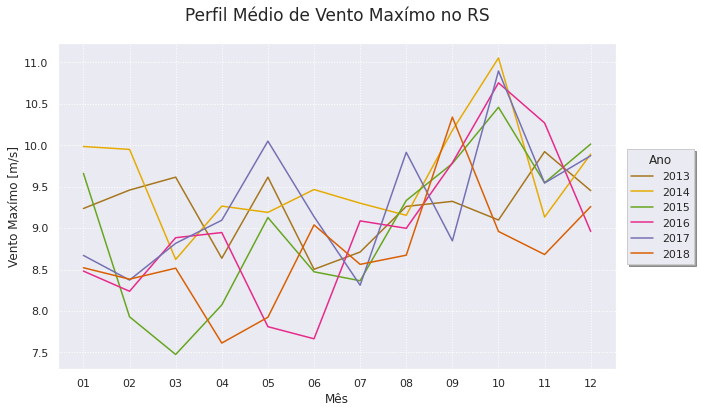

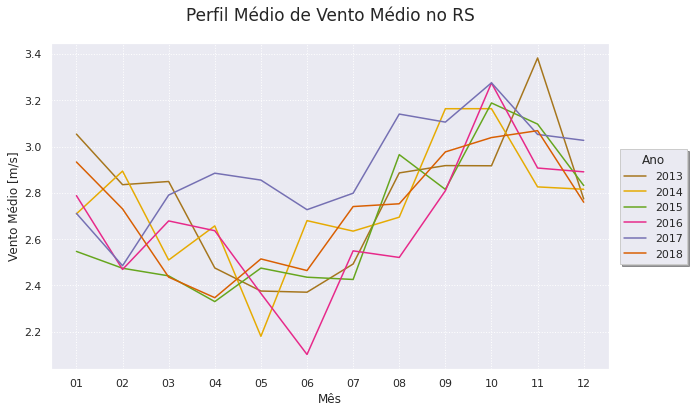

In [51]:
for i in range(0,len(parametros)):
    perfil_medio_clima(i, 'Perfil Médio de ', ' no RS')

##Juntando DF

In [52]:
climaPivot.sample(5)

,data,"(temperatura, ALEGRETE)","(temperatura, BAGE)","(temperatura, BENTO GONCALVES)","(temperatura, CACAPAVA DO SUL)","(temperatura, CAMAQUA)","(temperatura, CAMPO BOM)","(temperatura, CANELA)","(temperatura, CANGUCU)","(temperatura, CRUZ ALTA)","(temperatura, DOM PEDRITO)","(temperatura, ERECHIM)","(temperatura, FREDERICO WESTPHALEN)","(temperatura, IBIRUBA)","(temperatura, JAGUARAO)","(temperatura, LAGOA VERMELHA)","(temperatura, MOSTARDAS)","(temperatura, PALMEIRA DAS MISSOES)","(temperatura, PASSO FUNDO)","(temperatura, PORTO ALEGRE)","(temperatura, QUARAI)","(temperatura, RIO GRANDE)","(temperatura, RIO PARDO)","(temperatura, SANTA MARIA)","(temperatura, SANTA ROSA)","(temperatura, SANTANA DO LIVRAMENTO)","(temperatura, SANTIAGO)","(temperatura, SANTO AUGUSTO)","(temperatura, SAO BORJA)","(temperatura, SAO GABRIEL)","(temperatura, SAO JOSE DOS AUSENTES)","(temperatura, SAO LUIZ GONZAGA)","(temperatura, SOLEDADE)","(temperatura, Santa Vitoria do Palmar - Barra do Chui)","(temperatura, TEUTONIA)","(temperatura, TORRES)","(temperatura, TRAMANDAI)","(temperatura, URUGUAIANA)","(temperatura, media)","(Dias_com_precip, ALEGRETE)",...,"(vento_med, BAGE)","(vento_med, BENTO GONCALVES)","(vento_med, CACAPAVA DO SUL)","(vento_med, CAMAQUA)","(vento_med, CAMPO BOM)","(vento_med, CANELA)","(vento_med, CANGUCU)","(vento_med, CRUZ ALTA)","(vento_med, DOM PEDRITO)","(vento_med, ERECHIM)","(vento_med, FREDERICO WESTPHALEN)","(vento_med, IBIRUBA)","(vento_med, JAGUARAO)","(vento_med, LAGOA VERMELHA)","(vento_med, MOSTARDAS)","(vento_med, PALMEIRA DAS MISSOES)","(vento_med, PASSO FUNDO)","(vento_med, PORTO ALEGRE)","(vento_med, QUARAI)","(vento_med, RIO GRANDE)","(vento_med, RIO PARDO)","(vento_med, SANTA MARIA)","(vento_med, SANTA ROSA)","(vento_med, SANTANA DO LIVRAMENTO)","(vento_med, SANTIAGO)","(vento_med, SANTO AUGUSTO)","(vento_med, SAO BORJA)","(vento_med, SAO GABRIEL)","(vento_med, SAO JOSE DOS AUSENTES)","(vento_med, SAO LUIZ GONZAGA)","(vento_med, SOLEDADE)","(vento_med, Santa Vitoria do Palmar - Barra do Chui)","(vento_med, TEUTONIA)","(vento_med, TORRES)","(vento_med, TRAMANDAI)","(vento_med, URUGUAIANA)","(vento_med, media)","(dt, Ano)","(dt, Mês)","(dt, Ano Mês)"
69,2018-10-31,19.756452,17.823045,17.215726,16.842876,18.055698,20.306855,15.282124,15.806989,18.458199,18.353305,17.603629,19.654167,18.959274,17.005108,16.811693,18.993683,14.664765,17.860618,20.031048,18.389028,17.849328,19.605048,19.509525,20.543683,17.386290,18.640995,19.622262,21.153397,19.644624,13.041532,20.586244,17.234274,15.715323,20.068683,19.733509,19.934677,20.353396,18.337759,8.0,...,2.754147,3.085349,4.111694,0.309292,1.303763,2.880242,4.774194,4.280780,4.192241,0.000000,0.828360,2.800000,2.639651,3.656720,6.312769,1.263756,3.744624,1.921111,3.733333,3.346505,2.787905,2.384888,1.958468,3.402016,1.156855,2.577554,0.266752,2.788441,6.250695,3.065843,4.974597,5.306989,2.037366,3.444898,5.336290,4.028177,3.038972,2018,10,2018-10
31,2015-08-31,18.867083,17.295697,13.589198,16.924167,18.483481,20.706806,16.618889,16.235417,17.711268,17.346250,18.116667,19.976944,19.647083,16.563889,17.147917,18.409444,19.203750,17.807597,20.257917,19.694213,17.667083,19.209167,19.935833,21.331019,22.319010,18.351528,19.602500,19.711806,19.125972,14.362222,20.531076,17.987639,15.726944,20.459306,18.745574,18.758472,18.225695,18.450122,11.0,...,4.078319,2.829379,4.430000,0.611012,1.431667,3.671528,5.218889,0.697421,3.858195,2.318611,0.482500,2.469086,3.000139,3.388581,5.388055,3.610278,3.774354,1.351528,2.508065,3.327917,2.172222,2.704028,1.352419,2.633333,3.079833,2.754861,0.172778,2.425694,6.476280,2.197222,5.071806,4.992361,2.353472,2.968321,4.731667,2.895556,2.965226,2015,08,2015-08
16,2014-05-31,15.508602,14.485119,14.384274,12.840278,15.114072,16.577823,12.892876,13.496774,15.045027,14.778853,18.589333,15.857007,15.237500,15.177462,13.898118,17.523397,18.970182,14.650538,16.781183,14.905341,15.496102,15.639444,15.588441,18.533712,22.319010,15.268414,16.051210,16.8858

In [53]:
dfClimaMed = climaPivot[[('data'),('dt', 'Ano'),('dt', 'Mês'),('dt', 'Ano Mês'),('Dias_com_precip','media'),
            ('precipitacao','media'),('pressao','media'),('temperatura','media'),
            ('vento_max','media'),('vento_med','media')]].reset_index()

dfClimaMed.columns = ['col1','Data','Ano','Mês','Ano Mês','Dias com Precipitação',
                  'Precipitação','Pressão','Temperatura','Vento Máx','Vento Méd']
dfClimaMed.drop('col1', axis =1, inplace = True)
dfClimaMed.head()

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


,Data,Ano,Mês,Ano Mês,Dias com Precipitação,Precipitação,Pressão,Temperatura,Vento Máx,Vento Méd
0,2013-01-31,2013,01,2013-01,9.083333,117.477778,976.542712,22.323023,9.236111,3.053842
1,2013-02-28,2013,02,2013-02,13.777778,148.188889,975.360036,22.569606,9.458333,2.835475
2,2013-03-31,2013,03,2013-03,13.527778,146.822222,977.684966,19.726666,9.613889,2.849183
3,2013-04-30,2013,04,2013-04,11.055556,119.877778,978.880230,18.709059,8.636111,2.475605
4,2013-05-31,2013,05,2013-05,15.527778,110.616667,979.065763,15.344357,9.613889,2.375910


In [54]:
VarClima = dfClimaMed.corr().columns

In [55]:
dfClimaMed.corr()

,Dias com Precipitação,Precipitação,Pressão,Temperatura,Vento Máx,Vento Méd
Dias com Precipitação,1.000000,0.603485,0.106778,-0.304594,0.217580,-0.110965
Precipitação,0.603485,1.000000,-0.270595,0.151276,0.558776,0.408570
Pressão,0.106778,-0.270595,1.000000,-0.857748,-0.244932,-0.322083
Temperatura,-0.304594,0.151276,-0.857748,1.000000,0.024348,0.193680
Vento Máx,0.217580,0.558776,-0.244932,0.024348,1.000000,0.688467
Vento Méd,-0.110965,0.408570,-0.322083,0.193680,0.688467,1.000000


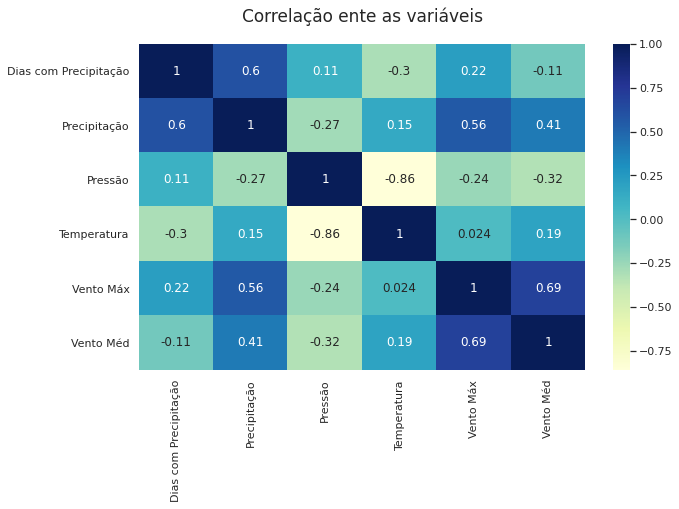

In [56]:
sns.set_theme()
style.use(DefStyle)  #4
#plt.rc_context({'axes.edgecolor':'gray', 'xtick.color':'white', 'axes.titlecolor':'white','ytick.color':'white', 'figure.facecolor':'black'})

plt.figure(figsize=DefSize)
plt.title('Correlação ente as variáveis',y=1.05,fontsize = 17)
ax = sns.heatmap(dfClimaMed.corr(),cmap="YlGnBu", annot=True) 

In [57]:
anuario2013_2018RS.reset_index(inplace = True)
anuario2013_2018RS.head(5)

,Ano,Mês,Data,Ano Mês,SetorN1,UF,Consumo
0,2013,1,2013-01-01,2013-01,Comercial,RS,470456.0
1,2013,1,2013-01-01,2013-01,Consumo Próprio,RS,49063.0
2,2013,1,2013-01-01,2013-01,Iluminação Pública,RS,60929.0
3,2013,1,2013-01-01,2013-01,Industrial,RS,730711.0
4,2013,1,2013-01-01,2013-01,Poder Público,RS,54805.0


In [59]:
anuario2013_2018RS_pvt = anuario2013_2018RS.drop(columns=['UF'])
anuario2013_2018RS_pvt = anuario2013_2018RS_pvt.pivot(index=['Ano','Mês','Data','Ano Mês'], columns='SetorN1')
anuario2013_2018RS_pvt = anuario2013_2018RS_pvt.reset_index()
anuario2013_2018RS_pvt.head()

Ano Mês       Data  ...     Consumo                          
SetorN1                       ... Residencial     Rural Serviço Público
0        2013   1 2013-01-01  ...    702161.0  339480.0         56846.0
1        2013   2 2013-02-01  ...    665088.0  414663.0         54553.0
2        2013   3 2013-03-01  ...    640371.0  323379.0         53366.0
3        2013   4 2013-04-01  ...    586910.0  254855.0         53507.0
4        2013   5 2013-05-01  ...    607578.0  212174.0         54464.0

[5 rows x 12 columns]

In [61]:
col0 = anuario2013_2018RS_pvt.droplevel(0,axis=1).columns
col1 = anuario2013_2018RS_pvt.droplevel(1,axis=1).columns

In [62]:
col = [c for c in col1 if c != 'Consumo'] + [c for c in col0 if c != '']

In [63]:
anuario2013_2018RS_pvt = anuario2013_2018RS_pvt.droplevel(0,axis=1)
anuario2013_2018RS_pvt.columns = col
anuario2013_2018RS_pvt.sample(5)

,Ano,Mês,Data,Ano Mês,Comercial,Consumo Próprio,Iluminação Pública,Industrial,Poder Público,Residencial,Rural,Serviço Público
1,2013,2,2013-02-01,2013-02,458756.000,41079.000,57946.000,848900.000,54230.000,665088.000,414663.000,54553.000
71,2018,12,2018-12-01,2018-12,445676.802,8937.571,69389.512,718997.415,64098.562,721388.958,395485.763,61748.919
57,2017,10,2017-10-01,2017-10,387340.000,20363.000,68367.000,813106.100,56076.000,647111.000,279534.000,56134.000
19,2014,8,2014-08-01,2014-08,411559.000,36331.000,65438.000,902429.000,54339.000,691800.000,234536.000,57341.000
43,2016,8,2016-08-01,2016-08,366845.000,30869.000,68232.000,821032.000,58214.000,661583.000,275579.000,55114.000


In [64]:
dfClimaMed['Data'] = pd.to_datetime(dfClimaMed['Data'])

In [65]:
dfClimaMed.head()

,Data,Ano,Mês,Ano Mês,Dias com Precipitação,Precipitação,Pressão,Temperatura,Vento Máx,Vento Méd
0,2013-01-31,2013,01,2013-01,9.083333,117.477778,976.542712,22.323023,9.236111,3.053842
1,2013-02-28,2013,02,2013-02,13.777778,148.188889,975.360036,22.569606,9.458333,2.835475
2,2013-03-31,2013,03,2013-03,13.527778,146.822222,977.684966,19.726666,9.613889,2.849183
3,2013-04-30,2013,04,2013-04,11.055556,119.877778,978.880230,18.709059,8.636111,2.475605
4,2013-05-31,2013,05,2013-05,15.527778,110.616667,979.065763,15.344357,9.613889,2.375910


In [66]:
dfClimaMed.columns

Index(['Data', 'Ano', 'Mês', 'Ano Mês', 'Dias com Precipitação',
       'Precipitação', 'Pressão', 'Temperatura', 'Vento Máx', 'Vento Méd'],
      dtype='object')

In [67]:
anuario2013_2018RS_pvt.columns

Index(['Ano', 'Mês', 'Data', 'Ano Mês', 'Comercial', 'Consumo Próprio',
       'Iluminação Pública', 'Industrial', 'Poder Público', 'Residencial',
       'Rural', 'Serviço Público'],
      dtype='object')

In [68]:
dfClimaMed.drop(columns=['Data']).head(2)

,Ano,Mês,Ano Mês,Dias com Precipitação,Precipitação,Pressão,Temperatura,Vento Máx,Vento Méd
0,2013,01,2013-01,9.083333,117.477778,976.542712,22.323023,9.236111,3.053842
1,2013,02,2013-02,13.777778,148.188889,975.360036,22.569606,9.458333,2.835475


In [69]:
anuario2013_2018RS_pvt.drop(columns=['Data','Ano','Mês']).head(2)

,Ano Mês,Comercial,Consumo Próprio,Iluminação Pública,Industrial,Poder Público,Residencial,Rural,Serviço Público
0,2013-01,470456.0,49063.0,60929.0,730711.0,54805.0,702161.0,339480.0,56846.0
1,2013-02,458756.0,41079.0,57946.0,848900.0,54230.0,665088.0,414663.0,54553.0


In [70]:
anuario2013_2018RS[['Ano Mês','Consumo']].groupby('Ano Mês').sum().head(2)

,Consumo
Ano Mês,
2013-01,2464451.0
2013-02,2595215.0


In [71]:
dfConsumoClima = pd.merge(dfClimaMed.drop(columns=['Data']),
                          anuario2013_2018RS_pvt.drop(columns=['Data','Ano','Mês']),left_on='Ano Mês',right_on='Ano Mês')


In [72]:
dfConsumoClima = pd.merge(dfConsumoClima,
                          anuario2013_2018RS[['Ano Mês','Consumo']].groupby('Ano Mês').sum(),left_on='Ano Mês',right_on='Ano Mês')

In [73]:
dfConsumoClima

,Ano,Mês,Ano Mês,Dias com Precipitação,Precipitação,Pressão,Temperatura,Vento Máx,Vento Méd,Comercial,Consumo Próprio,Iluminação Pública,Industrial,Poder Público,Residencial,Rural,Serviço Público,Consumo
0,2013,01,2013-01,9.083333,117.477778,976.542712,22.323023,9.236111,3.053842,470456.000,49063.000,60929.000,730711.000,54805.000,702161.000,339480.000,56846.000,2464451.000
1,2013,02,2013-02,13.777778,148.188889,975.360036,22.569606,9.458333,2.835475,458756.000,41079.000,57946.000,848900.000,54230.000,665088.000,414663.000,54553.000,2595215.000
2,2013,03,2013-03,13.527778,146.822222,977.684966,19.726666,9.613889,2.849183,443185.000,44410.000,59584.000,867536.000,54628.000,640371.000,323379.000,53366.000,2486459.000
3,2013,04,2013-04,11.055556,119.877778,978.880230,18.709059,8.636111,2.475605,415763.000,38742.000,60252.000,889147.000,52302.000,586910.000,254855.000,53507.000,2351478.000
4,2013,05,2013-05,15.527778,110.616667,979.065763,15.344357,9.613889,2.375910,416262.000,43299.000,61889.000,931849.000,54670.000,607578.000,212174.000,54464.000,2382185.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2018,08,2018-08,13.378378,112.513514,983.580447,12.728181,8.672973,2.752923,377802.646,20222.021,70464.781,892343.212,58458.728,716372.596,284391.552,59478.459,2479533.995
68,2018,09,2018-09,15.135135,186.659459,979.606405,17.418561,10.337838,2.976997,372050.357,17057.601,68150.609,816826.855,57536.940,704877.625,281438.973,58203.619,2376142.579
69,2018,10,2018-10,11.432432,152.600000,979.110829,18.337759,8.959459,3.038972,388101.086,17952.394,71824.409,843107.068,53929.866,669235.095,278643.915,58414.989,2381208.822
70,2018,11,2018-11,10.189189,167.870270,977.640798,21.149839,8.681081,3.068813,419118.806,19032.409,68648.852,798865.118,60229.185,695900.541,310718.774,58691.597,2431205.282


In [74]:
dfConsumoClima['Ano'] = dfConsumoClima['Ano'].astype(int)
dfConsumoClima.corr()

,Ano,Dias com Precipitação,Precipitação,Pressão,Temperatura,Vento Máx,Vento Méd,Comercial,Consumo Próprio,Iluminação Pública,Industrial,Poder Público,Residencial,Rural,Serviço Público,Consumo
Ano,1.000000,-0.071579,-0.036054,0.180382,0.036315,-0.226920,0.043093,-0.122580,-0.690242,0.780251,-0.461388,0.409421,0.281595,0.396772,0.639238,0.127109
Dias com Precipitação,-0.071579,1.000000,0.603485,0.106778,-0.304594,0.217580,-0.110965,-0.130420,0.033197,0.006969,0.114460,-0.151140,-0.037128,-0.142244,-0.134925,-0.090834
Precipitação,-0.036054,0.603485,1.000000,-0.270595,0.151276,0.558776,0.408570,0.075829,0.043319,0.029659,-0.124248,-0.020983,-0.001711,0.001241,-0.049046,-0.018635
Pressão,0.180382,0.106778,-0.270595,1.000000,-0.857748,-0.244932,-0.322083,-0.622718,-0.012376,0.238096,0.309033,-0.208185,-0.275691,-0.491499,-0.119751,-0.431569
Temperatura,0.036315,-0.304594,0.151276,-0.857748,1.000000,0.024348,0.193680,0.814588,-0.069788,-0.125667,-0.420622,0.477503,0.514290,0.744991,0.424435,0.677312
Vento Máx,-0.226920,0.217580,0.558776,-0.244932,0.024348,1.000000,0.688467,-0.207337,0.125205,-0.073092,0.024111,-0.300710,-0.292260,-0.301492,-0.232253,-0.320592
Vento Méd,0.043093,-0.110965,0.408570,-0.322083,0.193680,0.688467,1.000000,-0.166240,-0.096750,0.122922,-0.053612,-0.166093,-0.156707,-0.155313,-0.059699,-0.209697
Comercial,-0.122580,-0.130420,0.075829,-0.622718,0.814588,-0.207337,-0.166240,1.000000,0.092341,-0.261841,-0.203232,0.594465,0.731025,0.769375,0.501939,0.900662
Consumo Próprio,-0.690242,0.033197,0.043319,-0.012376,-0.069788,0.125205,-0.096750,0.092341,1.000000,-0.557080,0.244117,-0.265312,-0.190065,-0.235820,-0.433288,-0.062846
Iluminação Pública,0.780251,0.006969,0.029659,0.238096,-0.125667,-0.073092,0.122922,-0.261841,-0.557080,1.000000,-0.297861,0.339329,0.122829,0.118028,0.509055,-0.054857


In [75]:
stl[14]

'seaborn-darkgrid'

In [76]:
VarClima

Index(['Dias com Precipitação', 'Precipitação', 'Pressão', 'Temperatura',
       'Vento Máx', 'Vento Méd'],
      dtype='object')

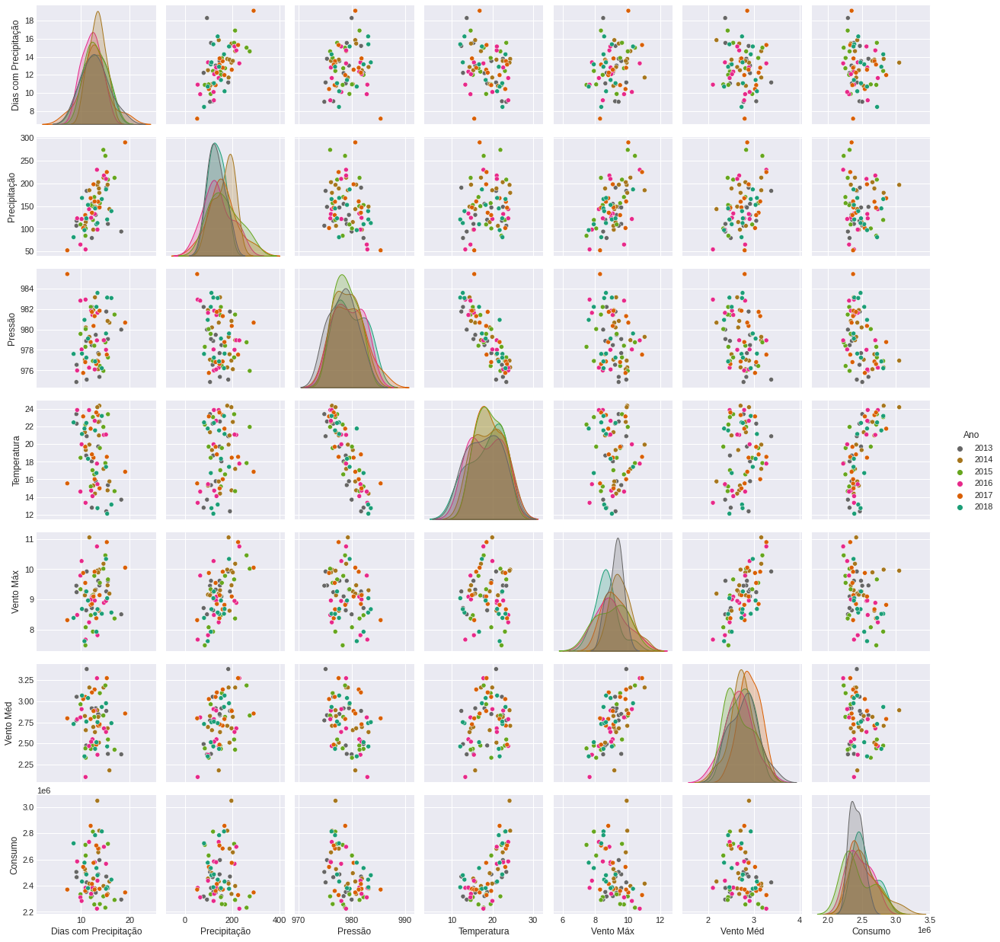

In [77]:
sns.set_theme()
style.use(stl[14])  #4
#style.context('ss')
#plt.rc_context({'axes.edgecolor':'gray', 'xtick.color':'white', 'axes.titlecolor':'white','axes.labelcolor':'white','ytick.color':'white', 'figure.facecolor':'black'})
#plt.rc_context({'axes.edgecolor':'gray', 'xtick.color':'white', 'ytick.color':'white', 'figure.facecolor':'black', 'title.color':'white' })
g = sns.pairplot(dfConsumoClima[['Ano', *VarClima, 'Consumo']], hue = "Ano", palette=DefPalette)
#g.map(sns.scatterplot)
#g.map_diag(sns.histplot)
#g.map_offdiag(sns.scatterplot)
#g.map(sns.lineplot)
#g.xticks(rotation = 90)
#plt.gcf().set_size_inches()
#print(g)


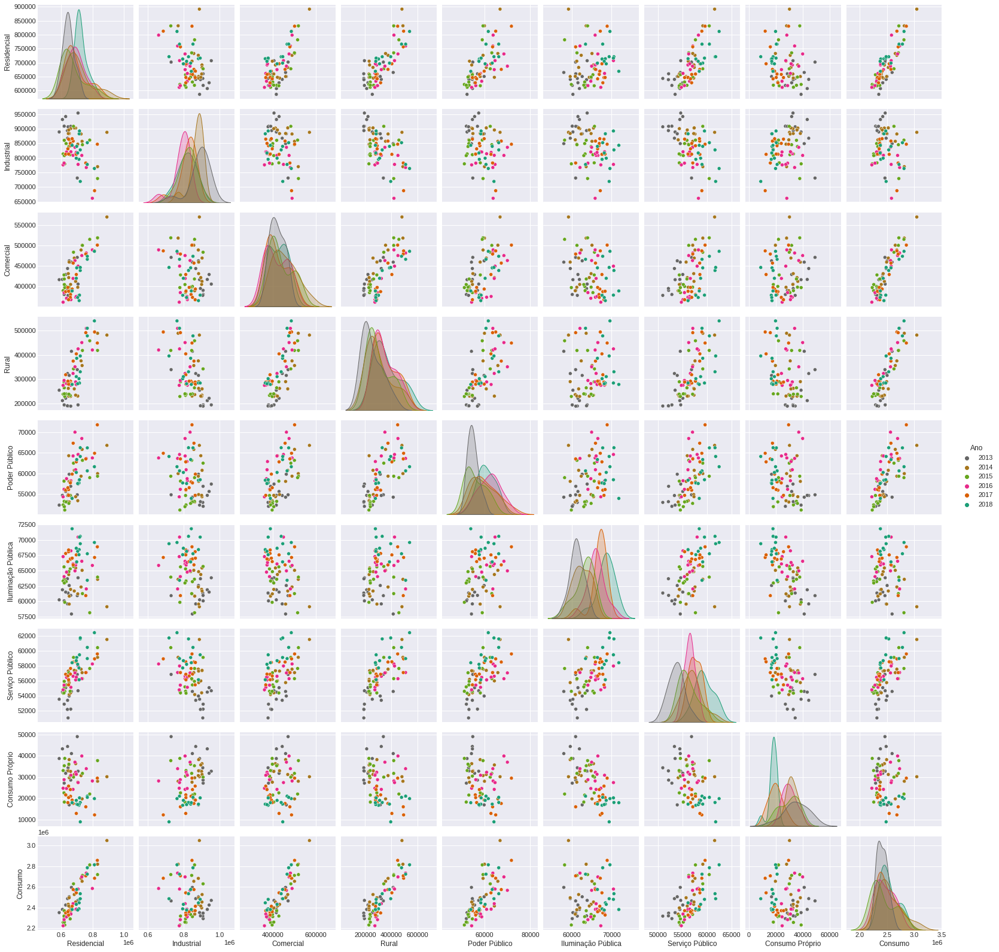

In [78]:
sns.set_theme()
style.use(stl[14])  #4
#style.context('ss')
#plt.rc_context({'axes.edgecolor':'gray', 'xtick.color':'white', 'axes.titlecolor':'white','axes.labelcolor':'white','ytick.color':'white', 'figure.facecolor':'black'})
#plt.rc_context({'axes.edgecolor':'gray', 'xtick.color':'white', 'ytick.color':'white', 'figure.facecolor':'black', 'title.color':'white' })
g = sns.pairplot(dfConsumoClima[['Ano', *SetorN1, 'Consumo']], hue = "Ano", palette=DefPalette)
#g.map(sns.scatterplot)
#g.map_diag(sns.histplot)
#g.map_offdiag(sns.scatterplot)
#g.map(sns.lineplot)
#g.xticks(rotation = 90)
#plt.gcf().set_size_inches()
#print(g)

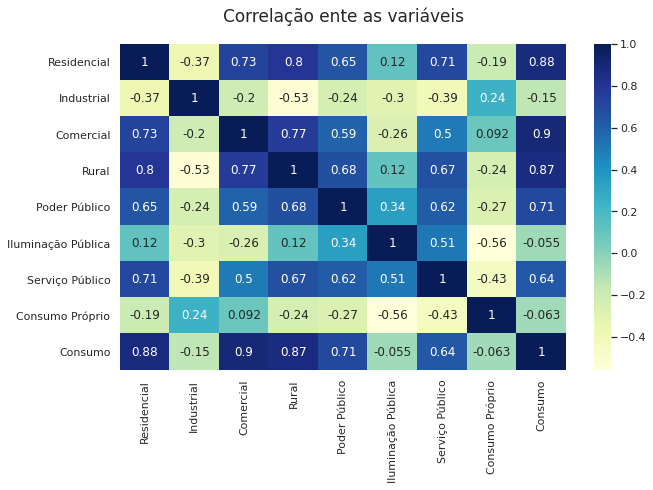

In [79]:
sns.set_theme()
style.use(DefStyle)  #4
#plt.rc_context({'axes.edgecolor':'gray', 'xtick.color':'white', 'axes.titlecolor':'white','ytick.color':'white', 'figure.facecolor':'black'})

plt.figure(figsize=DefSize)
plt.title('Correlação ente as variáveis',y=1.05,fontsize = 17)
ax = sns.heatmap(dfConsumoClima[[*SetorN1,'Consumo']].corr(),cmap="YlGnBu", annot=True) 

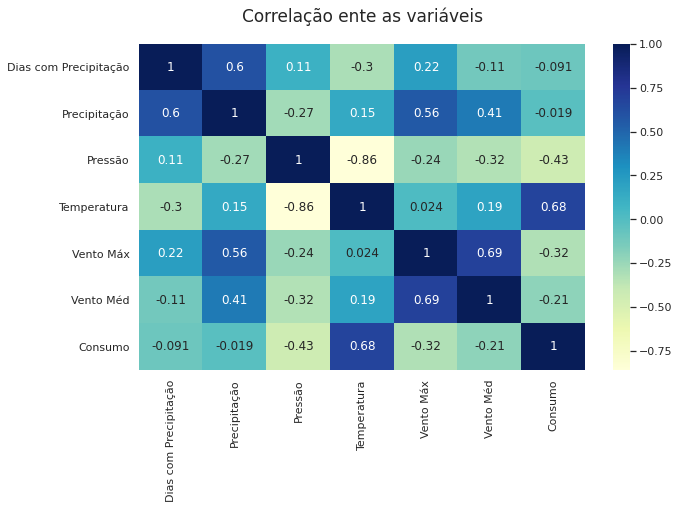

In [80]:
sns.set_theme()
style.use(DefStyle)  #4
#plt.rc_context({'axes.edgecolor':'gray', 'xtick.color':'white', 'axes.titlecolor':'white','ytick.color':'white', 'figure.facecolor':'black'})

plt.figure(figsize=DefSize)
plt.title('Correlação ente as variáveis',y=1.05,fontsize = 17)
ax = sns.heatmap(dfConsumoClima[[*VarClima,'Consumo']].corr(),cmap="YlGnBu", annot=True) 

##Abordagem inicial

###Média Aritmética

In [81]:
dfConsumoClima['Consumo Médio'] = dfConsumoClima['Consumo'].mean()
mean_absolute_percentage_error(dfConsumoClima['Consumo'],dfConsumoClima['Consumo Médio'])

0.056670717001995045

### Regressão Linear

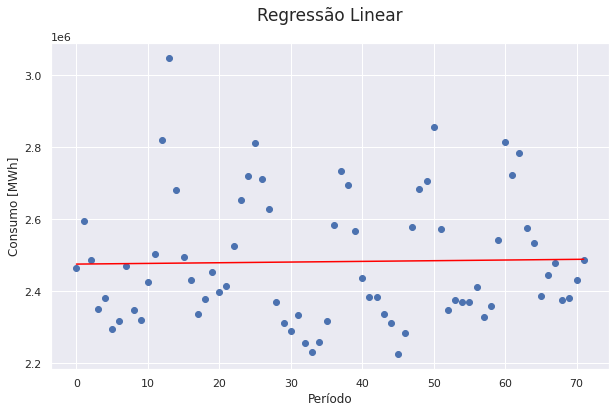

0.0566587901601516

In [82]:
data = dfConsumoClima['Consumo'].reset_index()
X = data.iloc[:, 0].values.reshape(-1, 1)  # values converts it into a numpy array
Y = data.iloc[:, 1].values.reshape(-1, 1)  # -1 means that calculate the dimension of rows, but have 1 column
linear_regressor = LinearRegression()  # create object for the class
linear_regressor.fit(X, Y)  # perform linear regression
Y_pred = linear_regressor.predict(X)  # make predictions

sns.set_theme()
style.use(DefStyle)
plt.figure(figsize=DefSize)
plt.scatter(X, Y)
plt.plot(X, Y_pred, color='red')
plt.title('Regressão Linear', fontsize = 17, y=1.05)
plt.ylabel('Consumo [MWh]')
plt.xlabel('Período')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(formatador_de_milhares))
plt.show();

dfConsumoClima['Rlin'] = Y_pred
display(mean_absolute_percentage_error(dfConsumoClima['Consumo'],Y_pred))

In [89]:
def perfil_consumo_vs_prev():
    sns.set_theme()
    style.use(DefStyle) 
    plt.figure(figsize=DefSize)

    ax1 = sns.lineplot(dfConsumoClima['Ano Mês'],dfConsumoClima['Consumo'], label = 'Real', palette = 'Dark2')
    ax2 = sns.lineplot(dfConsumoClima['Ano Mês'],dfConsumoClima['Consumo Médio'], label = 'Médio',palette = 'Dark2')
    ax3 = sns.lineplot(dfConsumoClima['Ano Mês'],dfConsumoClima['Rlin'], label = 'Rlin',palette = 'Dark2')
    plt.legend()
    plt.grid(True,linestyle = DefGrid)
    plt.title('Perfil de Consumo no RS Previsto', fontsize=17, y=1.05)
    ax3.yaxis.set_major_formatter(ticker.FuncFormatter(formatador_de_milhares))
    plt.ylabel('Consumo [MWh]')
    ax3.set_xticks(ax3.get_xticks()[::3])
    plt.xticks(rotation = 90, fontsize=10)

    plt.show()
    ;

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


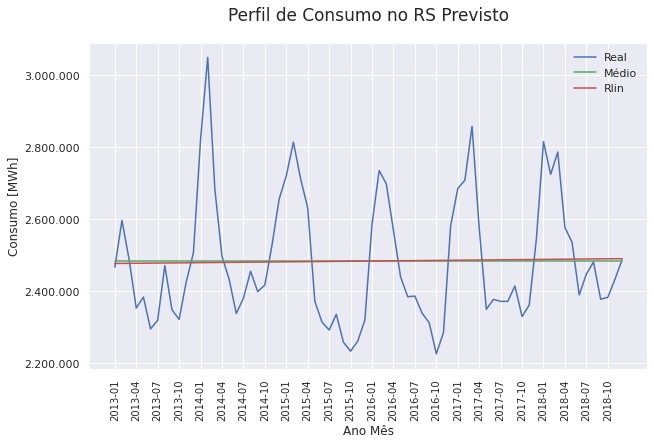

In [90]:
perfil_consumo_vs_prev()

In [92]:
dfConsumoClima.sample(2)

,Ano,Mês,Ano Mês,Dias com Precipitação,Precipitação,Pressão,Temperatura,Vento Máx,Vento Méd,Comercial,Consumo Próprio,Iluminação Pública,Industrial,Poder Público,Residencial,Rural,Serviço Público,Consumo,Consumo Médio,Rlin
9,2013,10,2013-10,12.194444,154.794444,978.472692,18.039489,9.097222,2.917060,394109.000,32943.000,63684.000,893766.000,53138.000,639359.000,190822.000,52140.000,2319961.000,2.482008e+06,2.477019e+06
62,2018,03,2018-03,12.891892,144.762162,976.874353,21.558056,8.516216,2.435886,473181.495,20470.209,67757.601,852282.194,66185.407,766321.173,478114.716,60476.087,2784788.882,2.482008e+06,2.486997e+06


In [ ]:
sns.displot(
    dfConsumoClima[*SetorN1], height=3, facet_kws=dict(margin_titles=True),

In [ ]:

fig, axs = plt.subplots(3, 3)
#gs = fig.add_gridspec(3, 3, hspace=0, wspace=0)
#(ax1, ax2, ax3), (ax5, ax5, ax6),(ax5, ax5, ax6) = gs.subplots(sharex='col', sharey='row')
#fig.suptitle('Sharing x per column, y per row')
#ax1.plot(x, y)
#ax2.plot(x, y**2, 'tab:orange')
#ax3.plot(x + 1, -y, 'tab:green')
#ax4.plot(x + 2, -y**2, 'tab:red')

#for ax in axs.flat:
    #ax.label_outer()



#axs = plt.figure(figsize=DefSize, constrained_layout=True).subplots(3, 3)
#axs = trim_axs(axs, 9)
#for ax, case in zip(axs, cases):
#int = 0
#for e, ax in enumerate(axs):
e= 1 
axs[1,0] = sns.lineplot(x=range(1,13), y=y.tail(12).iloc[:,e])
axs[1,1] = sns.lineplot(x=range(1,13), y=y.tail(12).iloc[:,e])
axs[1,2] = sns.lineplot(x=range(1,13), y=y.tail(12).iloc[:,e])

    #plt.ylim(0)
    #plt.xlim(1,12)
    #plt.title(i)
#    print(ax)
    #print(e, ax[0], ax[1])
    #ax[0] 
    #ax[1]
##    int +=1
plt.show();

In [159]:
y.iloc[:,0]

AttributeError: ignored

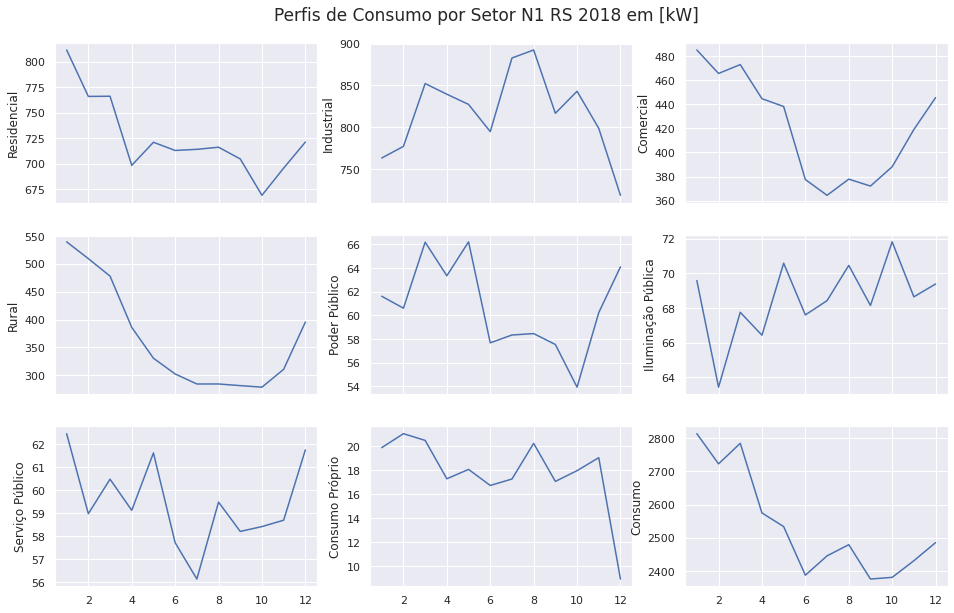

In [186]:
df = dfConsumoClima[['Residencial','Industrial','Comercial','Rural',
                   'Poder Público','Iluminação Pública','Serviço Público',
                   'Consumo Próprio','Consumo']]

fig, axs = plt.subplots(3, 3, figsize=(16, 10), sharex=True,)
count = 0 
for x in range(3):
    for y in range(3):
        sns.lineplot(ax=axs[x,y], x=range(1,13), y=df.tail(12).iloc[:,count]/1000)
        count +=1
plt.suptitle(x=.5,y=.93,t='Perfis de Consumo por Setor N1 RS 2018 em [kW]', fontsize = 17)
plt.show();



In [187]:
dfConsumoClima.to_csv(swap+'RS_2013_2018_df_consumo_clima.csv', index=False)